In [156]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import cv2
import numpy as np
import SimpleITK as sitk
import pandas as pd
import pandas.tools.plotting as pdplot

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import os
import time
import re
import sys
import pprint

import scipy.signal
import scipy.misc
import scipy.ndimage.filters

import PIL
from PIL import ImageDraw

import statsmodels.api as sm

import sklearn.decomposition

import skimage.filters
import skimage.util

import angles

import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed
from IPython.display import clear_output, display, HTML
from detect_peaks import detect_peaks

sys.path.insert(0, 'pyLAR')
sys.path.insert(0, 'PyRPCA')

#%load_ext rmagic

#Some nice default configuration for plots
plt.rcParams['figure.figsize'] = 30, 7
plt.rcParams['axes.grid'] = True
plt.gray()

titlesize = 25
labelsize = 20
linewidth = 4

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Utility Functions

In [113]:
def cvShowImage(imDisp, strName, strAnnotation = '', textColor=(0,0,255), resizeAmount=None):

    if resizeAmount is not None:
        imDisp = cv2.resize(imDisp.copy(), None, fx=resizeAmount, fy=resizeAmount)

    imDisp = cv2.cvtColor(imDisp, cv2.COLOR_GRAY2RGB)
    
    if len(strAnnotation) > 0:
        cv2.putText(imDisp, strAnnotation, (10, 20), cv2.FONT_HERSHEY_PLAIN, 2.0, textColor, thickness=2)
        
    cv2.imshow(strName, imDisp)   
    
def cvShowColorImage(imDisp, strName, strAnnotation = '', textColor=(0,0,255), resizeAmount=None):
    
    if resizeAmount is not None:
        imDisp = cv2.resize(imDisp.copy(), None, fx=resizeAmount, fy=resizeAmount)
    
    if len(strAnnotation) > 0:
        cv2.putText(imDisp, strAnnotation, (10, 20), cv2.FONT_HERSHEY_PLAIN, 2.0, textColor, thickness=2)
        
    cv2.imshow(strName, imDisp)   
       
def mplotShowImage(imInput):
    plt.imshow(imInput, cmap=plt.cm.gray)
    plt.grid(False)
    plt.xticks(())
    plt.yticks(())
    
def normalizeArray(a):
    return np.single((0.0 + a - a.min()) / (a.max() - a.min()))   

def AddTextOnImage(imInput, strText, loc=(2,2) ):
    
    imInputPIL = PIL.Image.fromarray( imInput )
    d = ImageDraw.Draw( imInputPIL )
    d.text( loc, strText )
    return np.asarray( imInputPIL )

def AddTextOnVideo( imVideo, strText, loc=(2,2) ):

    imVideoOut = np.zeros_like( imVideo )
    
    for i in range(imVideo.shape[2]):
        imVideoOut[:, :, i] = AddTextOnImage( imVideo[:,:,i], strText, loc )
        
    return imVideoOut
    
def cvShowVideo(imVideo, strWindowName, waitTime=30, resizeAmount=None):
    
    if not isinstance(imVideo, list):
        imVideo = [imVideo]
        strWindowName = [strWindowName]
        
    # find max number of frames
    maxFrames = 0
    
    for vid in range(len(imVideo)):
        
        if imVideo[vid].shape[2] > maxFrames:
            maxFrames = imVideo[vid].shape[2]
    
    # display video
    blnLoop = True      
    fid = 0
    
    while True:
        
        for vid in range(len(imVideo)):

            curVideoFid = fid % imVideo[vid].shape[2]
            imCur = imVideo[vid][:,:,curVideoFid]

            # show image
            cvShowImage(imCur, strWindowName[vid], '%d' % (curVideoFid+1),
                        resizeAmount=resizeAmount)

        # look for "esc" key
        k = cv2.waitKey(waitTime) & 0xff

        if blnLoop:

            if k == 27:            
                break
            elif k == ord(' '):
                blnLoop = False
            else:
                fid = (fid + 1) % maxFrames
                
        else:
                    
            if k == 27: # escape          
                break
                
            elif k == ord(' '): # space
                blnLoop = True
                
            elif k == 81: # left arrow
                fid = (fid - 1) % maxFrames
                
            elif k == 83: # right arrow
                fid = (fid + 1) % maxFrames                
            
    for vid in range(len(imVideo)):            
        cv2.destroyWindow(strWindowName[vid])
    
def normalizeArray(a):
    return np.single(0.0 + a - a.min()) / (a.max() - a.min())    
    
def loadVideoFromFile(dataFilePath, sigmaSmooth=None, resizeAmount=None):
    
    vidseq = cv2.VideoCapture(dataFilePath)

    # print metadata
    metadata = {}
    
    numFrames = vidseq.get(cv2.CAP_PROP_FRAME_COUNT)
    metadata['FRAME_COUNT'] = numFrames
    
    fps = vidseq.get(cv2.CAP_PROP_FPS)
    if fps > 0:
        print '\tFPS = ', fps
        metadata['FPS'] = fps

    fmt = vidseq.get(cv2.CAP_PROP_FORMAT)
    if fmt > 0:
        print '\FORMAT = ', fmt
        metadata['FORMAT'] = fmt
        
    vmode = vidseq.get(cv2.CAP_PROP_MODE)
    if vmode > 0:
        print '\MODE = ', vmode
        metadata['MODE'] = MODE
        
    # smooth if wanted
    if sigmaSmooth:        
        wSmooth = 4 * sigmaSmooth + 1            
    
    # read video frames
    imInput = []
    
    fid = 0
    prevPercent = 0
    print '\n'
    
    while True:
        valid_object, frame = vidseq.read()    
        
        if not valid_object:
            break    
             
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        if resizeAmount:
            frame = scipy.misc.imresize(frame, resizeAmount)
        
        if sigmaSmooth:        
            frame = cv2.GaussianBlur(frame, (wSmooth, wSmooth), 0)            
        if np.size(imInput) == 0:
            imInput = frame
        else:
            imInput = np.dstack((imInput, frame))            

        # update progress
        fid += 1
        curPercent = np.floor(100.0*fid/numFrames)
        if curPercent > prevPercent:
            prevPercent = curPercent
            print '%.2d%%' % curPercent, 
            
    print '\n'
    
    vidseq.release()
    return (imInput, metadata)

def writeVideoToFile(imVideo, filename, codec='DIVX', fps=30):

    # start timer
    tStart = time.time()

    # write video
    height, width, numFrames = imVideo.shape
    
    fourcc = cv2.cv.FOURCC(*list(codec))    
    writer = cv2.VideoWriter(filename, fourcc, fps=fps, frameSize=(width, height), isColor=0)

    print writer.isOpened()
    for fid in range(numFrames):
        writer.write(imVideo[:,:,fid].astype('uint8'))
        
    # end timer        
    tEnd = time.time()    
    print 'Writing video {} took {} seconds'.format(filename, tEnd - tStart) 
    
    # release
    writer.release()      
    
def writeVideoAsTiffStack(imVideo, strFilePrefix):
    
    # start timer
    tStart = time.time()
    
    for fid in range(imVideo.shape[2]):
        
        plt.imsave(strFilePrefix + '.%.3d.tif' % (fid+1), imVideo[:, :, fid])

    # end timer        
    tEnd = time.time()    
    print 'Writing video {} took {} seconds'.format(strFilePrefix, tEnd - tStart) 
        
def mplotShowMIP(im, axis, xlabel=None, ylabel=None, title=None):

    plt.imshow(im.max(axis))
    
    if title:
        plt.title(title)

    if xlabel:
        plt.xlabel(xlabel)
        
    if ylabel:
        plt.ylabel(ylabel)

def convertFromRFtoBMode( imInputRF ):
    return np.abs(scipy.signal.hilbert(imInputRF, axis=0))

def normalizeAngles(angleList, angle_range):
    return np.array([angles.normalize(i, angle_range[0], angle_range[1]) for i in angleList])

def SaveFigToDisk(saveDir, fileName, saveext = ['.png', '.eps'], **kwargs):
    for ext in saveext:
        plt.savefig( os.path.join(saveDir, fileName + ext), **kwargs)

def SaveImageToDisk(im, saveDir, fileName, saveext = ['.png']):
    for ext in saveext:
        plt.imsave( os.path.join(saveDir, fileName + ext), im )
        
def generateGatedVideoUsingSplineInterp(imInput, numOutFrames, minFrame, maxFrame, splineOrder):
    
    tZoom = np.float(numOutFrames) / (maxFrame - minFrame + 1)

    return scipy.ndimage.interpolation.zoom(imInput[:,:,minFrame:maxFrame+1], (1, 1, tZoom), order=splineOrder) 

def ncorr(imA, imB):
    
    imA = (imA - imA.mean()) / imA.std()
    imB = (imB - imB.mean()) / imB.std()
    
    return np.mean(imA * imB)    

## Set results root directory

In [114]:
#resultsRootDir = '.'
#resultsRootDir = '/home/cdeepakroy/work/gdrive_kitware/LowCostUltrasound/results/videos'
#resultsRootDir = '../../paper/MICCAI_2015/latex/srclnx/figures/'
resultsRootDir = 'results'

# Load Data

## Synthetic Data - Expanding/contracting circle

In [115]:
def genCircleData(phase, minRadius, maxRadius, 
                  smoothFactor=None, stdNoise=None,
                  padFactor=0.2, linewidth=1, maxIntensity=1,
                  bgndIntensityFactor=0.0, noiseMode='gaussian'):
    
    assert(maxRadius > minRadius)
    
    deltaRadius = maxRadius - minRadius
    meanRadius = 0.5 * (maxRadius + minRadius)
    
    w = 2 * (maxRadius + linewidth + padFactor * deltaRadius) + 1

    imCircleGen = bgndIntensityFactor * maxIntensity + np.zeros((w,w, np.size(phase)), 'float32')
    imCircleGen[0, 0, :] = 0
    
    x, y, p = np.meshgrid(np.arange(w), np.arange(w), phase)
    
    x -= 0.5 * w
    y -= 0.5 * w    
    r = (meanRadius + 0.5 * deltaRadius * np.sin(p))    
    
    distToCenter = np.sqrt(x**2 + y**2)
    maskCircle = np.abs(distToCenter - r) <= linewidth 
    
    imCircleGen[ maskCircle ] = maxIntensity

    # smoothing
    if smoothFactor and smoothFactor > 0:
        assert(smoothFactor < 1)
        smoothAmount = smoothFactor * deltaRadius        
        imCircleGen = scipy.ndimage.filters.gaussian_filter(imCircleGen, (smoothAmount, smoothAmount, 1))       

    imCircleGen = np.squeeze(imCircleGen)
        
    # add guassian noise    
    imCircleGen_prenoise = imCircleGen
    
    if stdNoise and stdNoise > 0:
        assert(stdNoise < 1)
        imCircleGen = skimage.util.random_noise(imCircleGen, 
                                                mode=noiseMode, var=stdNoise**2,
                                                clip=False)
        #imCircleGen[imCircleGen < 0] = 0
        imCircleGen[imCircleGen > maxIntensity] = maxIntensity
         
    # return stuff    
    radiusAtPhase = (meanRadius + 0.5 * deltaRadius * np.sin(phase))
    
    return imCircleGen, radiusAtPhase, imCircleGen_prenoise    

/home/cdeepakroy/anaconda/envs/lcus/lib/python2.7/site-packages/ipykernel/__main__.py:13: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


<function __main__.show_sample_image>

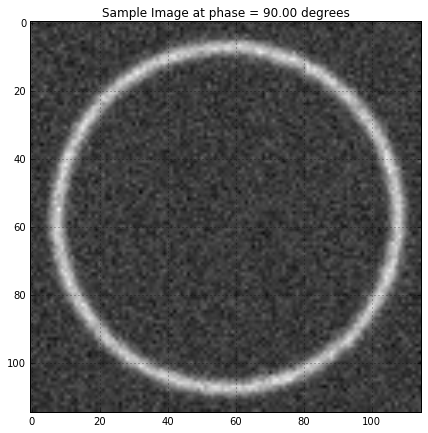

In [116]:
# show sample image
def show_sample_image(smoothFactor=0.05, stdNoise=0.05):
    
    samplePhase = 90 # in degrees
    imSample, r, _ = genCircleData(np.deg2rad(samplePhase), minRadius=20, maxRadius=50, 
                                   smoothFactor=smoothFactor, maxIntensity=1, stdNoise=stdNoise)

    plt.imshow(imSample)
    plt.title('Sample Image at phase = %.2f degrees' % samplePhase )
 
# show_sample_image()    
interact(show_sample_image, smoothFactor = (0.01, 0.1, 0.01), stdNoise = (0.02, 0.2, 0.02))    

#### Generate video

/home/cdeepakroy/anaconda/envs/lcus/lib/python2.7/site-packages/ipykernel/__main__.py:13: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


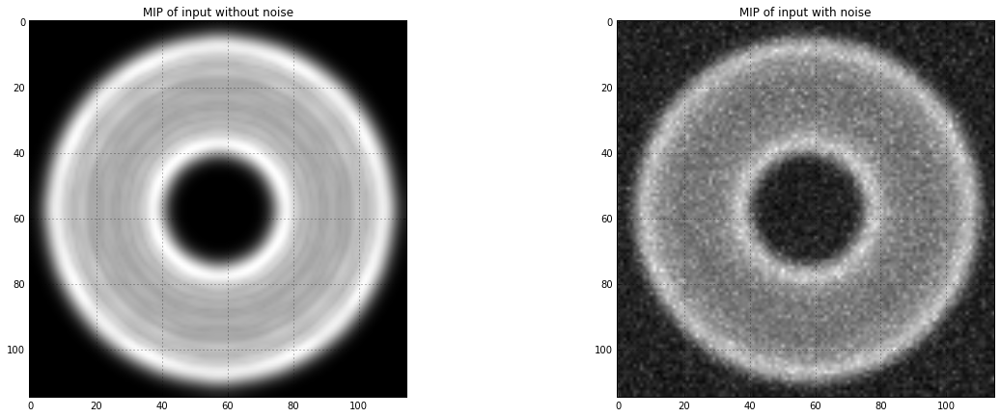

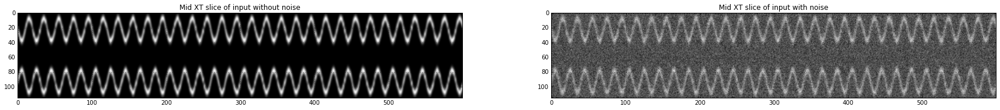

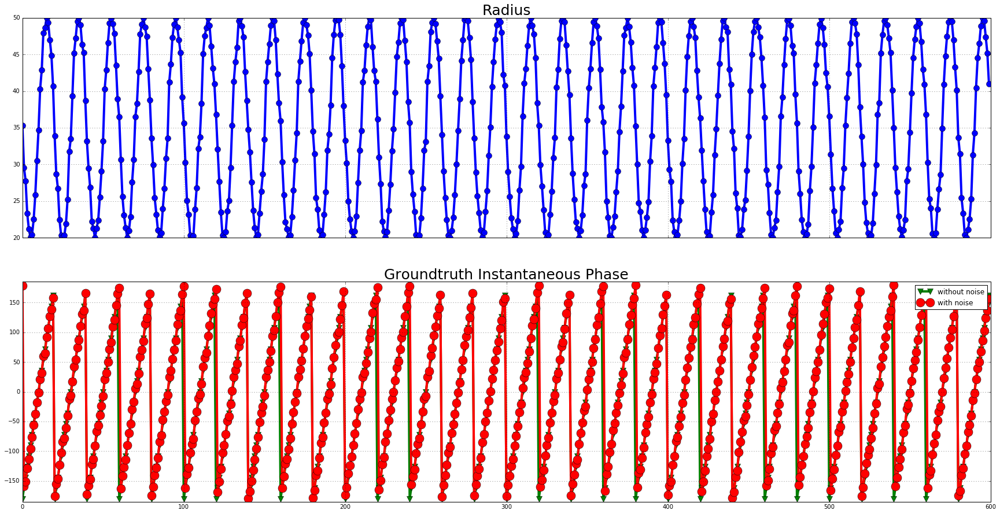

In [137]:
# parameters
minRadius=20 
maxRadius=50
smoothFactor=0.1

numPeriods = 30
numSamplesPerPeriod = 5 * 4
phaseNoiseLevel = 0.8 # fraction of (sampling-interval / 2)

noiseMode = 'gaussian'
bgndIntensityFactor = 0
stdNoise = 0.05

resizeAmount = 4.0

# generate video
np.random.seed(1)
samplingInterval = 360 / numSamplesPerPeriod # in degrees
phaseNoiseMax = phaseNoiseLevel * (samplingInterval / 2.0)

phaseGroundtruth_prenoise = np.linspace(0, 360 * numPeriods, numSamplesPerPeriod * numPeriods, endpoint=False) % 360
phaseGroundtruth = (phaseGroundtruth_prenoise + 
                    (2 * np.random.rand(phaseGroundtruth_prenoise.size) - 1) * phaseNoiseMax) % 360
phaseGroundtruth_prenoise += -180
phaseGroundtruth += -180

imInput_highres, ts_radius_highres, imInput_highres_prenoise = genCircleData(np.deg2rad(phaseGroundtruth), 
                                                                             minRadius=minRadius, maxRadius=maxRadius, 
                                                                             smoothFactor=smoothFactor,
                                                                             stdNoise=stdNoise)

framesPerSec = numSamplesPerPeriod

#show mip
plt.figure(figsize=(20, 7))

plt.subplot(1, 2, 1)
plt.imshow(imInput_highres_prenoise.max(2))
plt.title('MIP of input without noise')

plt.subplot(1, 2, 2)
plt.imshow(imInput_highres.max(2))
plt.title('MIP of input with noise')

# show mid XT slice
plt.figure()

plt.subplot(1, 2, 1)
plt.imshow(imInput_highres_prenoise[:, imInput_highres_prenoise.shape[1]/2, :])
plt.title('Mid XT slice of input without noise')

plt.subplot(1, 2, 2)
plt.imshow(imInput_highres[:, imInput_highres.shape[1]/2, :])
plt.title('Mid XT slice of input with noise')

# show circle radius
fig, ax = plt.subplots(2, 1, sharex=True, figsize=(30, 15))

l = phaseGroundtruth.size

ax[0].plot(ts_radius_highres[:l], '-o', markersize=10, linewidth=linewidth)
ax[0].set_title('Radius', fontsize=titlesize)

# show instantaneous phase
ax[1].plot(phaseGroundtruth_prenoise[:l], '-gv', markersize=10, linewidth=linewidth, label='without noise')
ax[1].plot(phaseGroundtruth[:l], '-ro', markersize=15, linewidth=linewidth, label='with noise')
ax[1].set_ylim([-185, 185])
ax[1].set_title('Groundtruth Instantaneous Phase', fontsize=titlesize)
ax[1].legend()

In [138]:
# make results dir
resultsDir = os.path.join(resultsRootDir, 'VibratingCircle')
resultFilePrefix = 'VibratingCircle'

if not os.path.exists(resultsDir):
    os.makedirs(resultsDir)
    
print 'Results store directory: ', resultsDir    

Results store directory:  results/VibratingCircle


In [170]:
# show video
cvShowVideo([normalizeArray(imInput_highres_prenoise), normalizeArray(imInput_highres)],
            ['Input Video Before Noise', 'Input Video After Noise'], resizeAmount=resizeAmount)

# Artificially downsample the data along the time dimension

In [139]:
#set parameters
timeDownsamplingFrameStep = 3

assert(timeDownsamplingFrameStep >= 1 and (timeDownsamplingFrameStep - np.floor(timeDownsamplingFrameStep) == 0))
       
# downsample the data by the specified amount
imInput = imInput_highres[:, :, ::timeDownsamplingFrameStep]

framesPerSecDownsmp = framesPerSec * (1.0 / timeDownsamplingFrameStep)

print '\nImage Size before downsampling in time: ', imInput_highres.shape
print 'Image Size after downsampling in time: ', imInput.shape

print '\nFrames per sec before downsampling in time: ', framesPerSec
print 'Frames per sec after downsampling in time: ', framesPerSecDownsmp


Image Size before downsampling in time:  (115, 115, 600)
Image Size after downsampling in time:  (115, 115, 200)

Frames per sec before downsampling in time:  20
Frames per sec after downsampling in time:  6.66666666667


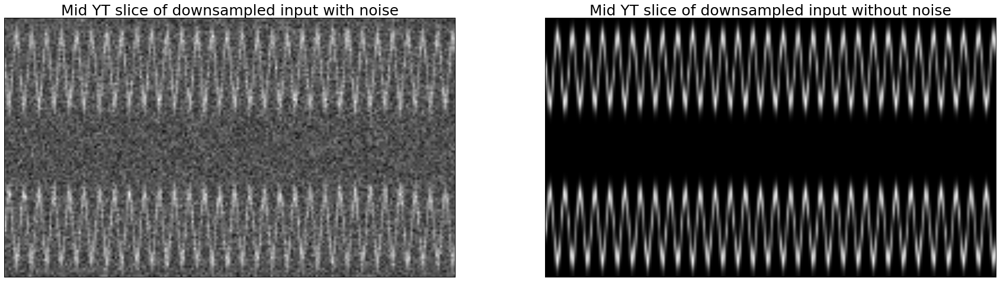

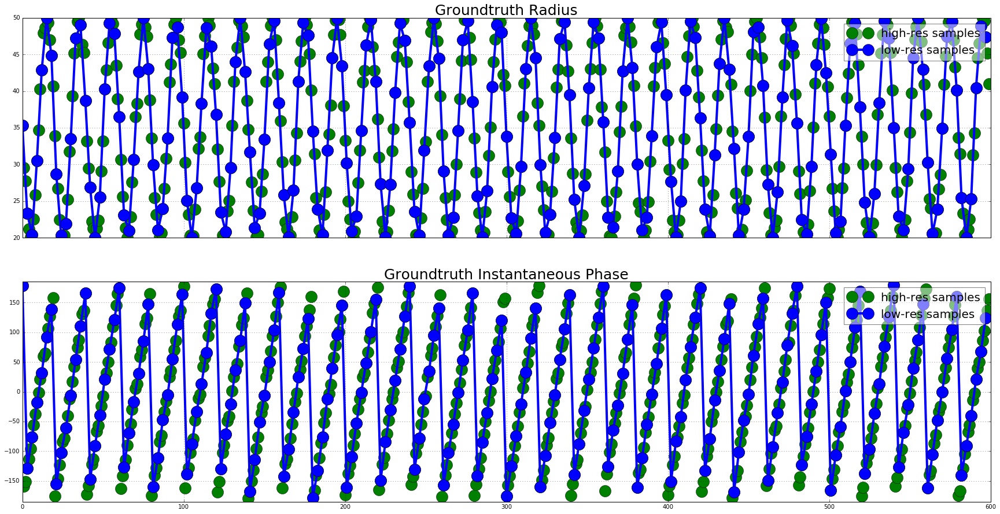

In [140]:
# show mid XT slice of downsampled input before and after noise
plt.figure(figsize=(30,10))

plt.subplot(121)
mplotShowImage(imInput[:, imInput.shape[1]/2, :])
plt.title('Mid YT slice of downsampled input with noise', fontsize=titlesize)

plt.subplot(122)
mplotShowImage(imInput_highres_prenoise[:, imInput.shape[1]/2, ::timeDownsamplingFrameStep])
plt.title('Mid YT slice of downsampled input without noise', fontsize=titlesize)

# show circle radius
fig, ax = plt.subplots(2, 1, sharex=True, figsize=(30, 15))

t = np.arange(ts_radius_highres.size)
ax[0].plot(t, ts_radius_highres, 'go', 
           markersize=20, linewidth=linewidth, label='high-res samples')
ax[0].plot(t[::timeDownsamplingFrameStep], ts_radius_highres[::timeDownsamplingFrameStep], '-bo', 
           markersize=20, linewidth=linewidth, label='low-res samples')
ax[0].set_title('Groundtruth Radius', fontsize=titlesize)
ax[0].legend(fontsize=labelsize, framealpha=0.5)

# show instantaneous phase
ax[1].plot(t, phaseGroundtruth, 'go', 
           markersize=20, linewidth=linewidth, label='high-res samples')
ax[1].plot(t[::timeDownsamplingFrameStep], phaseGroundtruth[::timeDownsamplingFrameStep], '-bo', 
           markersize=20, linewidth=linewidth, label='low-res samples')
ax[1].set_ylim([-185, 185])
ax[1].set_title('Groundtruth Instantaneous Phase', fontsize=titlesize)
ax[1].legend(fontsize=labelsize, framealpha=0.5)

In [141]:
# write our result
writeVideoToFile(normalizeArray( AddTextOnVideo(imInput, 'Input - %.2f fps' % framesPerSecDownsmp) ) * 255, 
                 os.path.join(resultsDir, 'Input.avi'), 
                 codec='DIVX', fps=framesPerSecDownsmp)

True
Writing video results/VibratingCircle/Input.avi took 0.072557926178 seconds


In [ ]:
cvShowVideo([normalizeArray(imInput_highres), normalizeArray(imInput)],
            ['Input high-res video', 'Input artifical low-res video'], resizeAmount=resizeAmount)

### Run the algorithm

In [142]:
import USGatingAndSuperResolution as superUS

In [143]:
algo = superUS.USGatingAndSuperResolution(xyDownsamplingFactor=1, gammaFactor=1.0, lrconvtol=1e-5)
algo.setInput(imInput)
algo.process()

Input video size:  (115, 115, 200)

>> Step-1: Suppressing noise using low-rank plus sparse decomposition ...

[iter: 0000]: rank(P) = 0003, |C|_0 = 0072, crit=0.4876383250, total sparse =0000
[iter: 0010]: rank(P) = 0074, |C|_0 = 2290400, crit=0.0102998753, total sparse =42102
[iter: 0020]: rank(P) = 0116, |C|_0 = 2555243, crit=0.0000239584, total sparse =41896
Low-rank plus sparse decomposition took 8.07127189636 seconds

Noise suppression took a total of 8.43 seconds

>> Step-2: Estimating instantaneous phase ...

Reducing dimensionality using PCA ...  took 0.181712150574 seconds
4 eigen vectors were needed to cover 99.00% of variance

Computing frame similarity matrix as -ve distance in pca-reduced space ... 
000 001 002 003 004 005 006 007 008 009 010 011 012 013 014 015 016 017 018 019 020 021 022 023 024 025 026 027 028 029 030 031 032 033 034 035 036 037 038 039 040 041 042 043 044 045 046 047 048 049 050 051 052 053 054 055 056 057 058 059 060 061 062 063 064 065 066 067 068 0

In [144]:
# retrieve noise suppression results
imD = algo.imD_
imLowRank = algo.imLowRank_
imSparse = algo.imSparse_
gamma = algo.gammaFactor

# retrieve phase estimation results
X_proj = algo.X_proj_
simMat = algo.simMat_
simMat_Trend = algo.simMat_Trend_
simMat_Seasonal = algo.simMat_Seasonal_
spectralEntropy = algo.spectralEntropy_
fid_best = algo.fid_best_

ts = algo.ts_
ts_trend = algo.ts_trend_
ts_seasonal = algo.ts_seasonal_
period = algo.period_

ts_analytic = algo.ts_analytic_
ts_instaamp = algo.ts_instaamp_
ts_instaphase = algo.ts_instaphase_
ts_instaphase_nmzd = algo.ts_instaphase_nmzd_

### Results for MICCAI

#### Figures depicting noise suppression

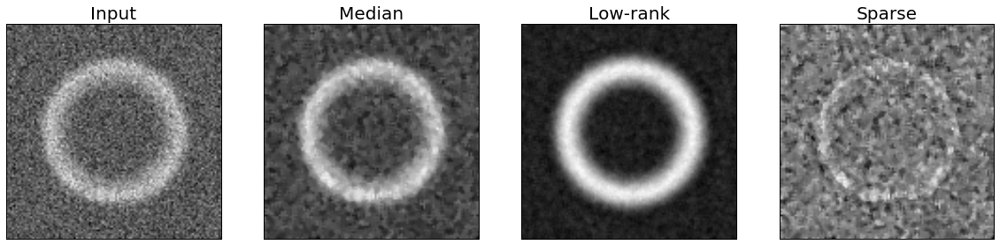

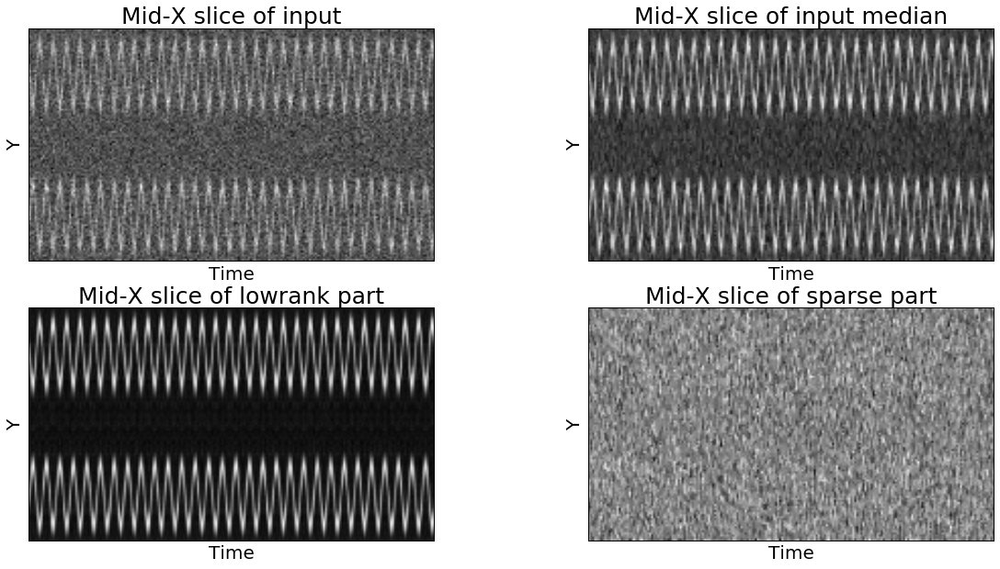

In [145]:
#
# Show MIPs of Input, Lowrank and Sparse parts
#
dispframe = 0

# Input
plt.figure(figsize=(20,15))

plt.subplot(141)
mplotShowImage(imInput[:, :, dispframe])
plt.title('Input', fontsize=labelsize)
SaveImageToDisk(imInput.max(2), resultsDir, 'imInput')

# smoothed input
plt.subplot(142)
mplotShowImage(imD[:, :, dispframe])
plt.title('Median', fontsize=labelsize)
SaveImageToDisk(imD.max(2), resultsDir, 'imMedian')

# Low Rank
plt.subplot(143)
mplotShowImage(imLowRank[:, :, dispframe])
plt.title('Low-rank', fontsize=labelsize)
SaveImageToDisk(imLowRank.max(2), resultsDir, 'imLowRank')

# Sparse
plt.subplot(144)
mplotShowImage(imSparse[:, :, dispframe])
plt.title('Sparse', fontsize=labelsize)
SaveImageToDisk(imSparse.max(2), resultsDir, 'imSparse')

#
# Show Mid XT slices of Input, Lowrank and Sparse parts
#

# Input
plt.figure(figsize=(20, 10))

plt.subplot(221)

mplotShowImage(imInput[:, imInput.shape[1]/2, :])
plt.title('Mid-X slice of input', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('Y', fontsize=labelsize)
SaveImageToDisk(imInput[:, imInput.shape[1]/2, :], resultsDir, 'imInput_MidX')

# Smoothed Input
plt.subplot(222)

mplotShowImage(imD[:, imD.shape[1]/2, :])
plt.title('Mid-X slice of input median', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('Y', fontsize=labelsize)
SaveImageToDisk(imD[:, imD.shape[1]/2, :], resultsDir, 'imMedian_MidX')

# Low Rank
plt.subplot(223)

mplotShowImage(imLowRank[:, imLowRank.shape[1]/2, :])
plt.title('Mid-X slice of lowrank part', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('Y', fontsize=labelsize)
SaveImageToDisk(imLowRank[:, imLowRank.shape[1]/2, :], resultsDir, 'imLowRank_MidX')

# Sparse
plt.subplot(224)

mplotShowImage(imSparse[:, imSparse.shape[1]/2, :])
plt.title('Mid-X slice of sparse part', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('Y', fontsize=labelsize)
SaveImageToDisk(imSparse[:, imSparse.shape[1]/2, :], resultsDir, 'imSparse_MidX')

#### Figures depicting phase estimation

beats per minute at 6.666667 fps = 60.000000

Mean consective frame RMSE of input =  0.0733123450028
Mean consecutive frame ncorr of input =  0.164336003526

Mean consective frame RMSE of input ordered by estimate phase =  0.0711528855336
Mean consective frame ncorr of input ordered by estimate phase =  0.534931516263

Mean consective frame RMSE of input ordered by groundtruth phase =  0.070878653818
Mean consective frame ncorr of input ordered by groundtruth phase =  0.54341766167
Mean phase error with groundtruth = 0.05
Stddev phase error with groundtruth = 0.02
Mean phase diff error with groundtruth = 0.02
Stddev phase diff error with groundtruth = 0.02


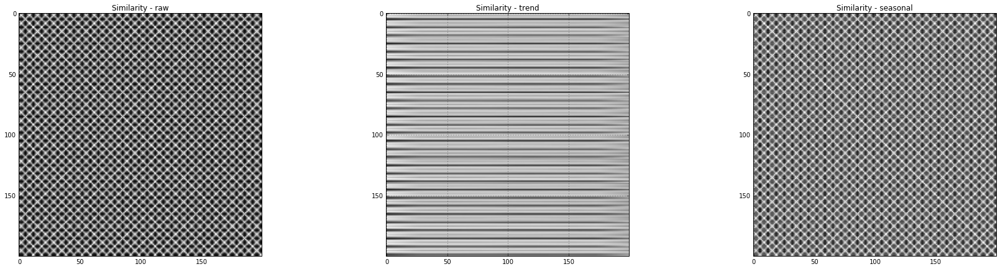

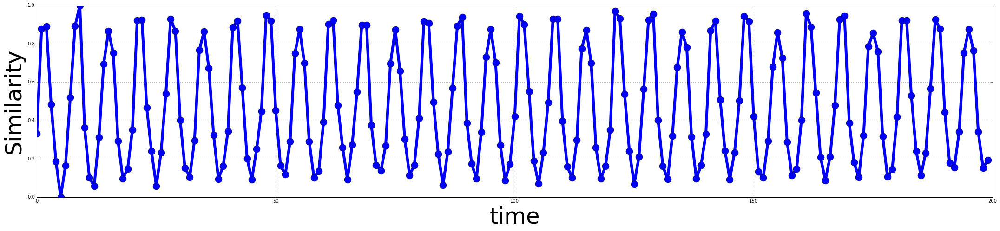

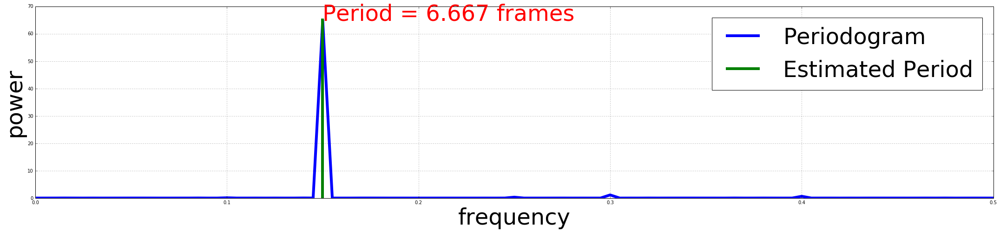

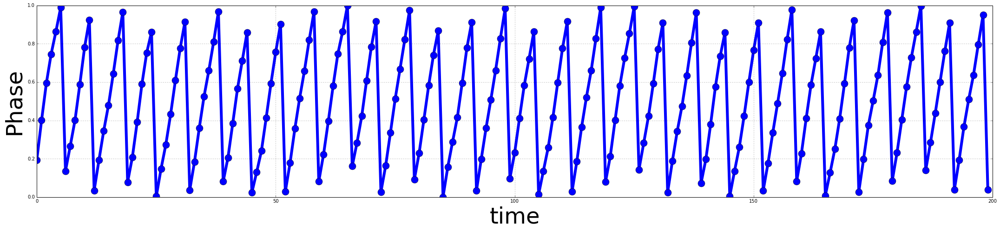

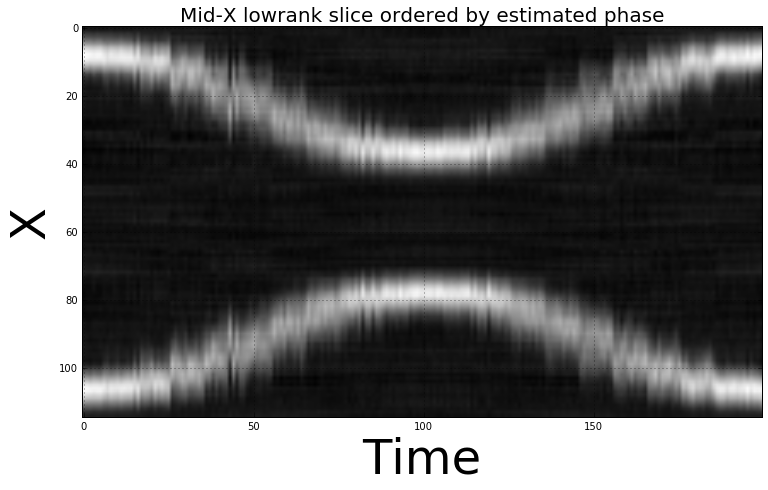

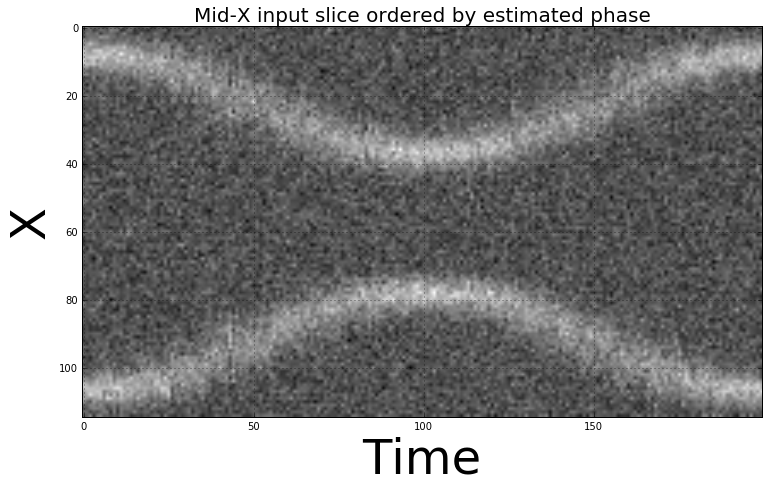

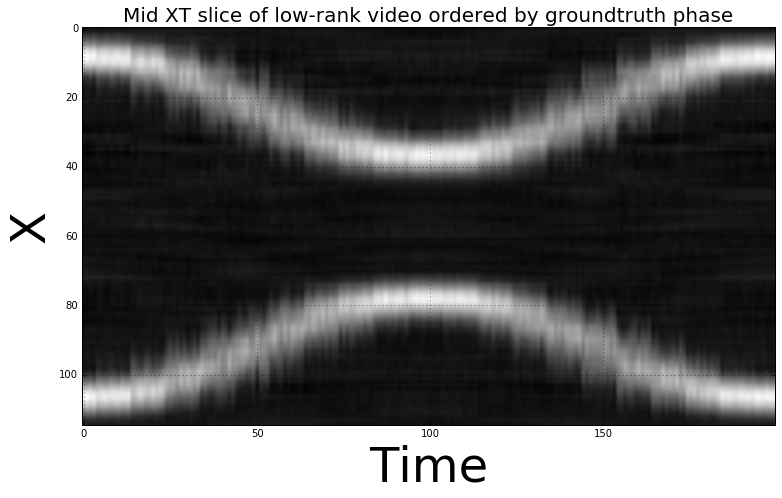

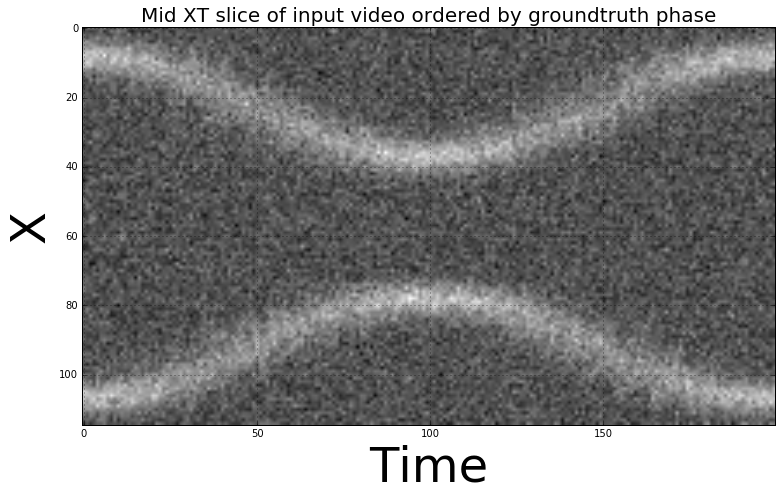

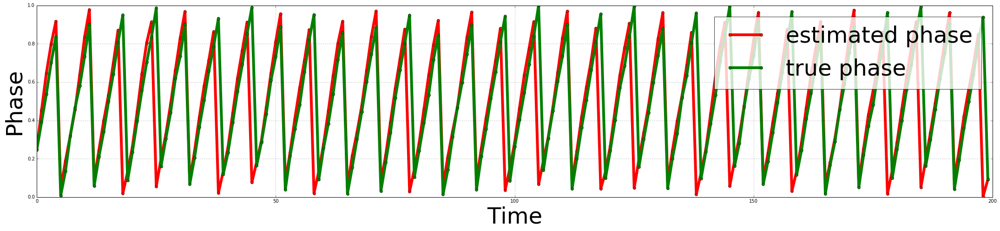

In [146]:
curlinewidth = 6
curmarkersize = 15
curlabelsize = 48
xmid = imInput.shape[1]/2

#
# plot the whole similarity landscape along with its trend and seasonal parts
#
fig, ax = plt.subplots(1, 3)

ax[0].imshow(simMat)
ax[0].set_title('Similarity - raw')
SaveImageToDisk(simMat, resultsDir, 'simMat')

ax[1].imshow(simMat_Trend)
ax[1].set_title('Similarity - trend')
SaveImageToDisk(simMat_Trend, resultsDir, 'simMat_Trend')

ax[2].imshow(simMat_Seasonal)
ax[2].set_title('Similarity - seasonal')
SaveImageToDisk(simMat_Seasonal, resultsDir, 'simMat_Seasonal')

# Show detrended similarity
plt.figure()
plt.plot(normalizeArray(ts_seasonal) , '-o', markersize=curmarkersize, linewidth=curlinewidth)
plt.legend(fontsize=curlabelsize)
plt.xlabel('time', fontsize=curlabelsize)
plt.ylabel('Similarity', fontsize=curlabelsize)
plt.tight_layout()
SaveFigToDisk(resultsDir, 'ts_seasonal', bbox_inches='tight')

# show periodogram
plt.figure()
freq, power = scipy.signal.periodogram(ts_seasonal)
beatsPerMinute = algo.period_ * 60.0 / framesPerSecDownsmp
print "beats per minute at %f fps = %f" % (framesPerSecDownsmp, beatsPerMinute)
maxPowerLoc = np.argmax(power)

plt.plot(freq, power, linewidth=curlinewidth, label='Periodogram')
plt.plot([freq[maxPowerLoc], freq[maxPowerLoc]], 
           [0, power[maxPowerLoc]], 'g', linewidth=curlinewidth, label='Estimated Period')
plt.text(freq[maxPowerLoc], power[maxPowerLoc], 
           'Period = %.3f frames' % (period), 
            fontsize=curlabelsize, color='r')
plt.xlabel('frequency', fontsize=curlabelsize)
plt.ylabel('power', fontsize=curlabelsize)
plt.legend(fontsize=curlabelsize)
plt.tight_layout()
SaveFigToDisk(resultsDir, 'periodogram')

# show instantaneous phase along with ground truth if available
plt.figure()

plt.plot(ts_instaphase_nmzd, '-o', 
         markersize = curmarkersize, linewidth=curlinewidth, label='estimated phase')
plt.xlabel('time', fontsize=curlabelsize)
plt.ylabel('Phase', fontsize=curlabelsize)
plt.tight_layout()
SaveFigToDisk(resultsDir, 'ts_instaphase')

# order input sequence by estimated phase
phaseord_est = np.argsort(ts_instaphase_nmzd)
imInput_phaseord_est = imInput[:,:,phaseord_est]
imLowrank_phaseord_est = imLowRank[:,:,phaseord_est]

consec_frame_mrmse_input = superUS.compute_mean_consec_frame_rmse(imInput)
print '\nMean consective frame RMSE of input = ', consec_frame_mrmse_input

consec_frame_mncorr_input = superUS.compute_mean_consec_frame_ncorr(imInput)
print 'Mean consecutive frame ncorr of input = ', consec_frame_mncorr_input

consec_frame_mrmse_input_phord_est = superUS.compute_mean_consec_frame_rmse(imInput_phaseord_est)
print '\nMean consective frame RMSE of input ordered by estimate phase = ', \
       consec_frame_mrmse_input_phord_est

consec_frame_mncorr_input_phord_est = superUS.compute_mean_consec_frame_ncorr(imInput_phaseord_est)
print 'Mean consective frame ncorr of input ordered by estimate phase = ', \
       consec_frame_mncorr_input_phord_est
    
# show mid-X slice of phase ordered low-rank and input video
plt.figure()
plt.imshow(imLowrank_phaseord_est[:, xmid, :])
plt.title('Mid-X lowrank slice ordered by estimated phase', fontsize=labelsize)
plt.xlabel('Time', fontsize=curlabelsize)
plt.ylabel('X', fontsize=curlabelsize)
SaveImageToDisk(imLowrank_phaseord_est[:, xmid, :], 
                resultsDir, 'Lowrank_est_phaseord_MidX')

plt.figure()
plt.imshow(imInput_phaseord_est[:, xmid, :])
plt.title('Mid-X input slice ordered by estimated phase', fontsize=labelsize)
plt.xlabel('Time', fontsize=curlabelsize)
plt.ylabel('X', fontsize=curlabelsize)
SaveImageToDisk(imInput_phaseord_est[:, xmid, :], 
                resultsDir, 'Input_est_phaseord_MidX')

if 'phaseGroundtruth' in locals() and phaseGroundtruth.size > 0:
    
    startphase = 0.75
    
    # compute groundtruth phase
    phaseGroundtruthDownsmp_nmzd = (180.0 + phaseGroundtruth[::timeDownsamplingFrameStep]) / 360.0
    
    # make startphase to be phase zero
    if startphase is not None:
        phaseGroundtruthDownsmp_nmzd = (phaseGroundtruthDownsmp_nmzd - startphase) % 1
    
    # alight the starting point of estimated phase with groundtruth phase    
    phaseOffset = (phaseGroundtruthDownsmp_nmzd[0] - ts_instaphase_nmzd[0]) % 1
    ts_instaphase_nmzd_aligned = (ts_instaphase_nmzd + phaseOffset) % 1
    
    # order input and low-rank videos by ground truth phase
    phaseord_gtruth = np.argsort( phaseGroundtruthDownsmp_nmzd )
    imInput_phaseord_gtruth = imInput[:, :, phaseord_gtruth]
    imLowrank_phaseord_gtruth = imLowRank[:, :, phaseord_gtruth]

    consec_frame_mrmse_input_phord_gtruth = superUS.compute_mean_consec_frame_rmse(imInput_phaseord_gtruth)
    print'\nMean consective frame RMSE of input ordered by groundtruth phase = ', \
          consec_frame_mrmse_input_phord_gtruth

    consec_frame_mncorr_input_phord_gtruth = superUS.compute_mean_consec_frame_ncorr(imInput_phaseord_gtruth)
    print'Mean consective frame ncorr of input ordered by groundtruth phase = ', \
          consec_frame_mncorr_input_phord_gtruth
        
    # compute phase error
    phaseError = superUS.phaseDist(phaseGroundtruthDownsmp_nmzd, ts_instaphase_nmzd_aligned)
    
    print 'Mean phase error with groundtruth = %.2f' % phaseError.mean()
    print 'Stddev phase error with groundtruth = %.2f' % phaseError.std() 

    # compute phase diff error
    ts_instaphase_nmzd_aligned_diff = superUS.phaseDiff(ts_instaphase_nmzd_aligned)
    phaseGroundtruthDownsmp_nmzd_diff = superUS.phaseDiff(phaseGroundtruthDownsmp_nmzd)        
    phaseDiffError = np.abs(ts_instaphase_nmzd_aligned_diff - phaseGroundtruthDownsmp_nmzd_diff)
    
    print 'Mean phase diff error with groundtruth = %.2f' % phaseDiffError.mean()
    print 'Stddev phase diff error with groundtruth = %.2f' % phaseDiffError.std() 
    
    # show mid XT slice
    plt.figure()
    plt.imshow(imLowrank_phaseord_gtruth[:, xmid, :])
    plt.title('Mid XT slice of low-rank video ordered by groundtruth phase', fontsize=labelsize)
    plt.xlabel('Time', fontsize=curlabelsize)
    plt.ylabel('X', fontsize=curlabelsize)
    plt.tight_layout()
    SaveImageToDisk(imInput_phaseord_gtruth[:, xmid, :], 
                    resultsDir, 'Lowrank_true_phaseord_MidX')
    
    plt.figure()
    plt.imshow(imInput_phaseord_gtruth[:, xmid, :])
    plt.title('Mid XT slice of input video ordered by groundtruth phase', fontsize=labelsize)
    plt.xlabel('Time', fontsize=curlabelsize)
    plt.ylabel('X', fontsize=curlabelsize)
    plt.tight_layout()
    SaveImageToDisk(imInput_phaseord_gtruth[:, xmid, :], 
                    resultsDir, 'Input_true_phaseord_MidX')
    
    # phase train
    plt.figure()
    
    plt.plot(ts_instaphase_nmzd_aligned, 'ro-', 
             linewidth=curlinewidth, label='estimated phase')
    plt.plot(phaseGroundtruthDownsmp_nmzd, 'go-', 
             linewidth=curlinewidth, label='true phase') 
    
    plt.xlabel('Time', fontsize=curlabelsize)
    plt.ylabel('Phase', fontsize=curlabelsize)
    plt.legend(fontsize=curlabelsize, framealpha=0.8)  
    plt.tight_layout()
    #plt.title('Comparison between estimated and true phase')    
    SaveFigToDisk(resultsDir, 'ts_instaphase_comparison')


In [147]:
# create a matrix where each row represents one frame
X = np.reshape(imInput, (np.prod(imInput.shape[:2]), imInput.shape[-1])).T

# perform pca on X
print 'Reducing dimensionality using PCA ... ', 

tPCA_Start = time.time()

pca = sklearn.decomposition.PCA(n_components = algo.pca_n_components)

X_proj = pca.fit_transform(X)

tPCA_End = time.time()

numEigenVectors = pca.n_components_

print 'took {} seconds'.format(tPCA_End - tPCA_Start)
print '%d eigen vectors were needed to cover %.2f%% of variance' % (numEigenVectors, 
                                                                    algo.pca_n_components * 100)

# compute mean consequent frame PCA space distance of input video
numFrames = imInput.shape[2]

mean_conseq_frame_dist_input = 0

for fid in range(numFrames-1):
    curFrameProj = X_proj[fid, :numEigenVectors]
    nextFrameProj = X_proj[fid+1, :numEigenVectors]
    curDist = np.sqrt(np.sum((nextFrameProj - curFrameProj)**2))
    
    mean_conseq_frame_dist_input += curDist
    
mean_conseq_frame_dist_input /= numFrames

print 'Mean consecutive frame PCA space distance of input video = ', mean_conseq_frame_dist_input

# compute mean consequent frame PCA space distance of input video ordered by estimated phase
mean_conseq_frame_dist_input_phaseord = 0

X_proj_phase_ord = X_proj[np.argsort(ts_instaphase_nmzd), :]

for fid in range(numFrames-1):
    curFrameProj = X_proj_phase_ord[fid, :numEigenVectors]
    nextFrameProj = X_proj_phase_ord[fid+1, :numEigenVectors]
    curDist = np.sqrt(np.sum((nextFrameProj - curFrameProj)**2))
    
    mean_conseq_frame_dist_input_phaseord += curDist
    
mean_conseq_frame_dist_input_phaseord /= numFrames

print 'Mean consecutive frame PCA space distance of input video ordered by estimated phase = ', \
      mean_conseq_frame_dist_input_phaseord

# compute mean consequent frame PCA space distance of input video randomly ordered
mean_conseq_frame_dist_input_randord = 0

X_proj_rand_ord = X_proj[np.random.permutation(numFrames), :]

for fid in range(numFrames-1):
    curFrameProj = X_proj_rand_ord[fid, :numEigenVectors]
    nextFrameProj = X_proj_rand_ord[fid+1, :numEigenVectors]
    curDist = np.sqrt(np.sum((nextFrameProj - curFrameProj)**2))
    
    mean_conseq_frame_dist_input_randord += curDist
    
mean_conseq_frame_dist_input_randord /= numFrames

print 'Mean consecutive frame PCA space distance of input video randomly ordered = ', \
      mean_conseq_frame_dist_input_randord    

Reducing dimensionality using PCA ...  took 0.248158931732 seconds
194 eigen vectors were needed to cover 99.00% of variance
Mean consecutive frame PCA space distance of input video =  11.0120100116
Mean consecutive frame PCA space distance of input video ordered by estimated phase =  8.14889699622
Mean consecutive frame PCA space distance of input video randomly ordered =  11.3656483961


#### Video depicting noise suppression

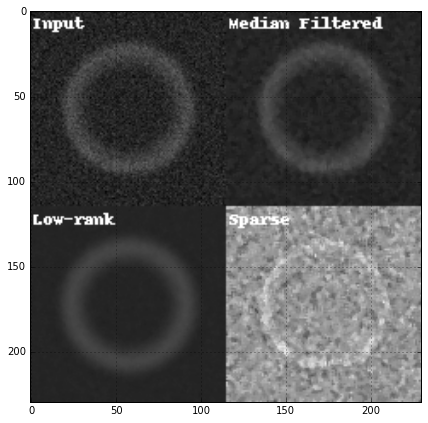

In [148]:
# make tiled video of Input, Median Filtered Input, Low-Rank, Sparse
imNoiseSuppressionVideo = np.zeros_like( np.tile(imInput, (2, 2, 1)) )

rsize, csize, nframes  = imInput.shape
imNoiseSuppressionVideo[:rsize, :csize, :] = AddTextOnVideo( imInput, 'Input' )
imNoiseSuppressionVideo[:rsize, csize:, :] = AddTextOnVideo( imD, 'Median Filtered' )
imNoiseSuppressionVideo[rsize:, :csize, :] = AddTextOnVideo( imLowRank, 'Low-rank' )
imNoiseSuppressionVideo[rsize:, csize:, :] = AddTextOnVideo( normalizeArray(imSparse), 'Sparse' )

# show mip
plt.figure()
plt.imshow(imNoiseSuppressionVideo[:, :, dispframe])

In [149]:
# write our result
writeVideoToFile(normalizeArray(imNoiseSuppressionVideo) * 255, 
                 os.path.join(resultsDir, 'NoiseSuppressionResult.avi'), 
                 codec='DIVX', fps=framesPerSecDownsmp)

True
Writing video results/VibratingCircle/NoiseSuppressionResult.avi took 0.236664056778 seconds


#### Video depicting phase estimation

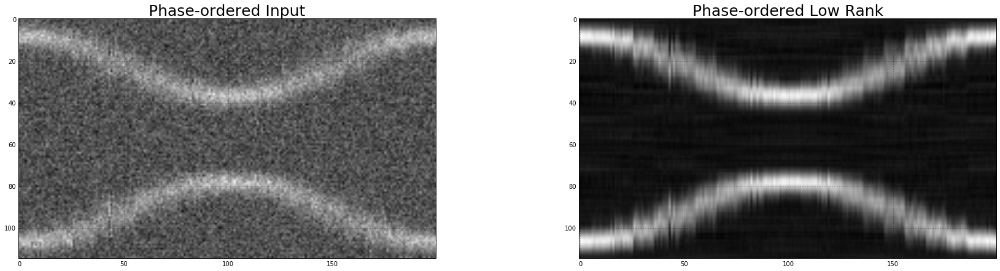

In [150]:
# make tiled video of Input and LowRank ordered by estimated phase
imPhaseEstimationVideo = np.zeros_like( np.tile(imInput, (1, 2, 1)) )

rsize, csize, nframes  = imInput.shape

imPhaseEstimationVideo[:rsize, :csize, :] = AddTextOnVideo( imInput_phaseord_est, 'Input' )
imPhaseEstimationVideo[:rsize, csize:, :] = AddTextOnVideo( imLowrank_phaseord_est, 'Low-rank' )

# show mip
plt.figure()

plt.subplot(1, 2, 1)
plt.imshow(imInput_phaseord_est[:, csize/2, :])
plt.title('Phase-ordered Input', fontsize=titlesize)

plt.subplot(1, 2, 2)
plt.imshow(imLowrank_phaseord_est[:, csize/2, :])
plt.title('Phase-ordered Low Rank', fontsize=titlesize)


In [151]:
# write our result
writeVideoToFile(normalizeArray(imPhaseEstimationVideo) * 255, 
                 os.path.join(resultsDir, 'PhaseEstimationResult.avi'), 
                 codec='DIVX', fps=framesPerSecDownsmp)

True
Writing video results/VibratingCircle/PhaseEstimationResult.avi took 0.219223976135 seconds


#### Video depicting super-resolution

In [152]:
import USGatingAndSuperResolution as superUS

upsampling by 2 using bspline_registration
07% 15% 23% 30% 38% 46% 53% 61% 69% 76% 84% 92% 

07% 15% 23% 30% 38% 46% 53% 61% 69% 76% 84% 92% 

True
Writing video results/VibratingCircle/OnePeriodVideo_Mag_2_bspline_registration.avi took 0.00504803657532 seconds


upsampling by 2 using linear_interpolation
07% 15% 23% 30% 38% 46% 53% 61% 69% 76% 84% 92% 

07% 15% 23% 30% 38% 46% 53% 61% 69% 76% 84% 92% 

True
Writing video results/VibratingCircle/OnePeriodVideo_Mag_2_linear_interpolation.avi took 0.00578808784485 seconds


upsampling by 4 using bspline_registration
03% 07% 11% 14% 18% 22% 25% 29% 33% 37% 40% 44% 48% 51% 55% 59% 62% 66% 70% 74% 77% 81% 85% 88% 92% 96% 

03% 07% 11% 14% 18% 22% 25% 29% 33% 37% 40% 44% 48% 51% 55% 59% 62% 66% 70% 74% 77% 81% 85% 88% 92% 96% 

True
Writing video results/VibratingCircle/OnePeriodVideo_Mag_4_bspline_registration.avi took 0.0338480472565 seconds


upsampling by 4 using linear_interpolation
03% 07% 11% 14% 18% 22% 25% 29% 33% 37% 40% 44% 48% 51

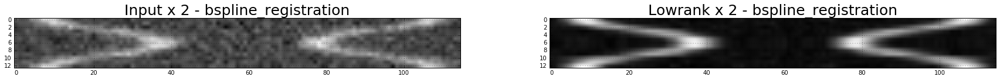

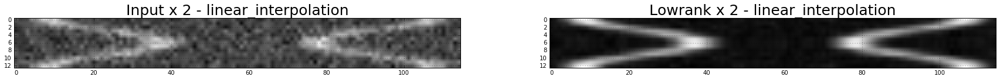

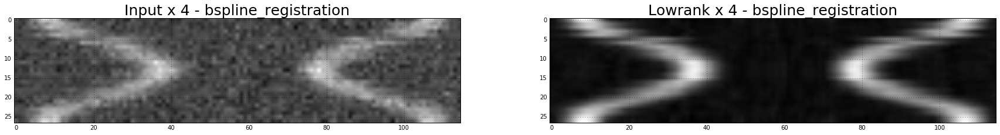

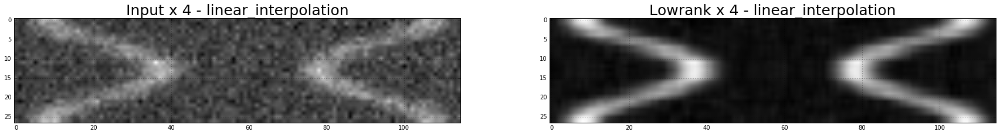

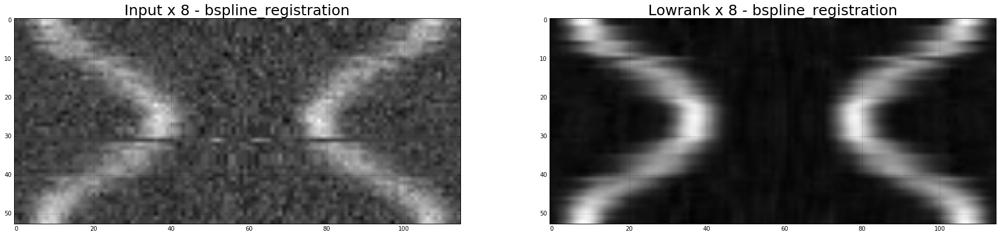

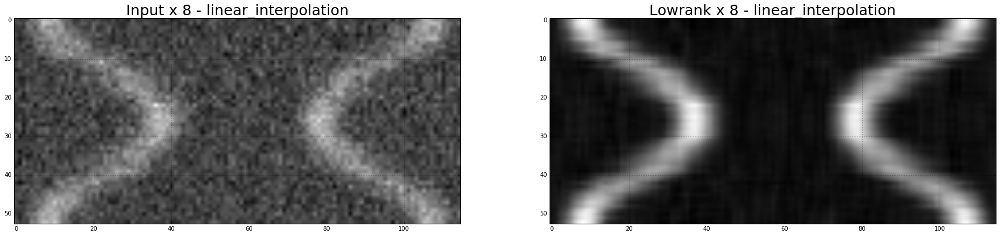

In [153]:
# set parmeters
upsampleAmountList = [2, 4, 8]

linear_interp_params = superUS.config_framegen_using_linear_interpolation()
bspline_reg_params = superUS.config_framegen_using_bspline_registration()

mparams_list = [bspline_reg_params, linear_interp_params]

# generate one-period video at higher resolution
for upsampleAmount in upsampleAmountList:    
    for mparams in mparams_list:
        
        print 'upsampling by %d using %s' % (upsampleAmount, mparams['name'])

        numOutFrames = np.uint(upsampleAmount * period + 0.5)        

        imCurOnePeriodVideo_Input = algo.generateSinglePeriodVideo(numOutFrames, imInput=imInput, method=mparams)
        imCurOnePeriodVideo_Lowrank = algo.generateSinglePeriodVideo(numOutFrames, imInput=imLowRank, method=mparams)

        imCurOnePeriodVideo = np.zeros_like(np.tile(imCurOnePeriodVideo_Input, (1, 2, 1)))
        rsize, csize, nframes  = imCurOnePeriodVideo_Input.shape

        imCurOnePeriodVideo[:rsize, :csize, :] = AddTextOnVideo( imCurOnePeriodVideo_Input,
                                                                 'Input Mag %d' % upsampleAmount )
        imCurOnePeriodVideo[:rsize, csize:, :] = AddTextOnVideo( imCurOnePeriodVideo_Lowrank,
                                                                 'Low-rank Mag %d' % upsampleAmount )
        writeVideoToFile(normalizeArray(imCurOnePeriodVideo) * 255, 
                         os.path.join(resultsDir, 
                                      'OnePeriodVideo_Mag_%d_%s.avi' % (upsampleAmount, mparams['name']) ), 
                         codec='DIVX', fps=framesPerSecDownsmp)

        plt.figure()

        plt.subplot(1, 2, 1)    
        plt.imshow(imCurOnePeriodVideo_Input[:, csize/2, :].T)
        plt.title('Input x %d - %s' % (upsampleAmount, mparams['name']), fontsize=titlesize)

        plt.subplot(1, 2, 2)    
        plt.imshow(imCurOnePeriodVideo_Lowrank[:, csize/2, :].T)
        plt.title('Lowrank x %d - %s' % (upsampleAmount, mparams['name']), fontsize=titlesize)
        
        print '\n'
    

### Validate phase estimation for varying noise levels

In [154]:
def validate_phase_estimation(stdNoiseList, numTrials=5,                             
                              minRadius=20, maxRadius=50, smoothFactor=0.05,
                              numPeriods=20, numSamplesPerPeriod=5*4, phaseNoiseLevel=0.8):
    
    simParams = {'minRadius': minRadius, 'maxRadius': maxRadius, 
                 'numPeriods': numPeriods, 'numSamplesPerPeriod': numSamplesPerPeriod,
                 'smoothFactor': smoothFactor, 'phaseNoiseLevel': phaseNoiseLevel,
                 'numTrials': numTrials, 'stdNoiseList': stdNoiseList}
    
    simResult = {}
    simResult['params'] = simParams
    
    # Run simulation
    np.random.seed(1)

    prevPercent = 0
    numParamValues = len(stdNoiseList)
    iter = 0

    meanPhaseErrorStats = np.zeros( (numParamValues, numTrials) )
    stdPhaseErrorStats = np.zeros( (numParamValues, numTrials) )
    
    meanPhaseDiffErrorStats = np.zeros( (numParamValues, numTrials) )
    stdPhaseDiffErrorStats = np.zeros( (numParamValues, numTrials) )
    
    consec_frame_mrmse_stats_input = np.zeros( (numParamValues, numTrials) )
    consec_frame_mrmse_stats_input_phord_est = np.zeros( (numParamValues, numTrials) )
    consec_frame_mrmse_stats_input_phord_gtruth = np.zeros( (numParamValues, numTrials) )

    consec_frame_mncorr_stats_input = np.zeros( (numParamValues, numTrials) )
    consec_frame_mncorr_stats_input_phord_est = np.zeros( (numParamValues, numTrials) )
    consec_frame_mncorr_stats_input_phord_gtruth = np.zeros( (numParamValues, numTrials) )
    
    tSim = time.time()

    for pid in range(numParamValues) :

        curStdNoise = stdNoiseList[pid]
        
        for tid in range(numTrials):

            print '\n\n**********************************************************'
            print 'Running trial %d with std-noise = %f' % (tid+1, curStdNoise)
            print '**************************************************************'

            tTrial = time.time()

            # generate video
            print '\n>>> Generating circle video ...\n'

            samplingInterval = 360 / numSamplesPerPeriod # in degrees
            phaseNoiseMax = phaseNoiseLevel * (samplingInterval / 2.0)

            curPhaseGroundtruth_prenoise = np.linspace(0, 360 * numPeriods, 
                                                       numSamplesPerPeriod * numPeriods, 
                                                       endpoint=False) % 360
            curPhaseGroundtruth = (curPhaseGroundtruth_prenoise + 
                                   (2 * np.random.rand(curPhaseGroundtruth_prenoise.size) - 1) * phaseNoiseMax) % 360
            curPhaseGroundtruth_prenoise += -180
            curPhaseGroundtruth += -180

            imCurInput, ts_radius_highres, imCurInput_prenoise = \
                genCircleData(np.deg2rad(curPhaseGroundtruth), 
                              minRadius=minRadius, maxRadius=maxRadius, 
                              smoothFactor=smoothFactor, stdNoise=curStdNoise)

            curFramesPerSec = numSamplesPerPeriod
            
            print 'Image Size: ', imCurInput.shape
            print '\nFrames per sec: ', curFramesPerSec
            
            # run our phase esimation algorithm
            print '\n>>> Running our phase estimation algorithm ...\n'

            import USGatingAndSuperResolution as superUS
            algo = superUS.USGatingAndSuperResolution(xyDownsamplingFactor=1)
            algo.setInput(imCurInput)
            algo.process()
            
            # compute phase estimation error
            curPhaseGroundtruth_nmzd = (180.0 + curPhaseGroundtruth) / 360.0
            phaseOffset = (algo.ts_instaphase_nmzd_[0] - curPhaseGroundtruth_nmzd[0])
            curPhaseGroundtruth_nmzd_aligned = (curPhaseGroundtruth_nmzd + phaseOffset)

            # compute groundtruth phase
            curPhaseGroundtruth_nmzd = (180.0 + curPhaseGroundtruth) / 360.0

            # make the max-radius point to be phase zero
            maxRadPhase = 0.75
            curPhaseGroundtruth_nmzd = (curPhaseGroundtruth_nmzd - maxRadPhase) % 1

            # alight the starting point of estimated phase with groundtruth phase    
            phaseOffset = (curPhaseGroundtruth_nmzd[0] - algo.ts_instaphase_nmzd_[0]) % 1
            cur_ts_instaphase_nmzd_aligned = (algo.ts_instaphase_nmzd_ + phaseOffset) % 1

            # compute phase error
            curPhaseError = superUS.phaseDist(curPhaseGroundtruth_nmzd, cur_ts_instaphase_nmzd_aligned)

            print 'Mean phase error with groundtruth = %.2f' % curPhaseError.mean()
            print 'Stddev phase error with groundtruth = %.2f' % curPhaseError.std() 

            meanPhaseErrorStats[pid, tid] = curPhaseError.mean()
            stdPhaseErrorStats[pid, tid] = curPhaseError.std()
            
            # compute phase diff error
            cur_ts_instaphase_nmzd_aligned_diff = superUS.phaseDiff(cur_ts_instaphase_nmzd_aligned)
            curPhaseGroundtruth_nmzd_diff = superUS.phaseDiff(curPhaseGroundtruth_nmzd)        
            
            curPhaseDiffError = np.abs(cur_ts_instaphase_nmzd_aligned_diff - curPhaseGroundtruth_nmzd_diff)

            print 'Mean phase diff error with groundtruth = %.2f' % curPhaseDiffError.mean()
            print 'Stddev phase diff error with groundtruth = %.2f' % curPhaseDiffError.std() 

            meanPhaseDiffErrorStats[pid, tid] = curPhaseDiffError.mean()
            stdPhaseDiffErrorStats[pid, tid] = curPhaseDiffError.std()

            # order input sequence by estimated phase
            phaseord_est = np.argsort(ts_instaphase_nmzd)
            imInput_phaseord_est = imCurInput[:,:,phaseord_est]

            # order input and low-rank videos by ground truth phase
            phaseord_gtruth = np.argsort( curPhaseGroundtruth_nmzd )
            imInput_phaseord_gtruth = imCurInput[:, :, phaseord_gtruth]

            # compute consec frame mrmse
            consec_frame_mrmse_input = superUS.compute_mean_consec_frame_rmse(imCurInput)
            print '\nMean consective frame RMSE of input = ', consec_frame_mrmse_input
            
            consec_frame_mrmse_input_phord_est = superUS.compute_mean_consec_frame_rmse(imInput_phaseord_est)
            print 'Mean consective frame RMSE of input ordered by estimate phase = ', \
                   consec_frame_mrmse_input_phord_est

            consec_frame_mrmse_input_phord_gtruth = superUS.compute_mean_consec_frame_rmse(imInput_phaseord_gtruth)
            print'Mean consective frame RMSE of input ordered by groundtruth phase = ', \
                  consec_frame_mrmse_input_phord_gtruth

            consec_frame_mrmse_stats_input[pid, tid] = consec_frame_mrmse_input
            consec_frame_mrmse_stats_input_phord_est[pid, tid] = consec_frame_mrmse_input_phord_est
            consec_frame_mrmse_stats_input_phord_gtruth[pid, tid] = consec_frame_mrmse_input_phord_gtruth
            
            # compute consec frame ncorr
            consec_frame_mncorr_input = superUS.compute_mean_consec_frame_ncorr(imCurInput)
            print '\nMean consecutive frame ncorr of input = ', consec_frame_mncorr_input
            
            consec_frame_mncorr_input_phord_est = superUS.compute_mean_consec_frame_ncorr(imInput_phaseord_est)
            print 'Mean consective frame ncorr of input ordered by estimate phase = ', \
                   consec_frame_mncorr_input_phord_est

            consec_frame_mncorr_input_phord_gtruth = superUS.compute_mean_consec_frame_ncorr(imInput_phaseord_gtruth)
            print'Mean consective frame ncorr of input ordered by groundtruth phase = ', \
                  consec_frame_mncorr_input_phord_gtruth

            consec_frame_mncorr_stats_input[pid, tid] = consec_frame_mncorr_input
            consec_frame_mncorr_stats_input_phord_est[pid, tid] = consec_frame_mncorr_input_phord_est
            consec_frame_mncorr_stats_input_phord_gtruth[pid, tid] = consec_frame_mncorr_input_phord_gtruth
                
            # update progress
            iter += 1

            curPercent = np.floor(100.0*iter/(numParamValues * numTrials) )
            if curPercent > prevPercent:
                prevPercent = curPercent
                print '%.2d%%' % curPercent,         

            print 'This trial took a total of %.2f seconds' % (time.time() - tTrial)

    print 'The entire simulation tool a total of %.2f seconds' % (time.time() - tSim)

    print '\nMean phase error stats: '
    pprint.pprint(meanPhaseErrorStats)
    
    print 'Stddev phase error stats: '
    pprint.pprint(stdPhaseErrorStats)
    
    print '\nMean phase diff error stats: '
    pprint.pprint(meanPhaseDiffErrorStats)
    
    print 'Stddev phase diff error stats: '
    pprint.pprint(stdPhaseDiffErrorStats)
    
    print 'Mean consecutive frame RMSE stats for Input: '
    print consec_frame_mrmse_stats_input
    
    print 'Mean consecutive frame RMSE stats for Input ordered by estimated phase: '
    pprint.pprint(consec_frame_mrmse_stats_input_phord_est)
    
    print 'Mean consecutive frame RMSE stats for Input ordered by gtruth phase: '
    pprint.pprint(consec_frame_mrmse_stats_input_phord_gtruth)
    
    print 'Mean consecutive frame NCORR stats for Input: '
    pprint.pprint(consec_frame_mncorr_stats_input)
    
    print 'Mean consecutive frame NCORR stats for Input ordered by estimated phase: '
    pprint.pprint(consec_frame_mncorr_stats_input_phord_est)
    
    print 'Mean consecutive frame NCORR stats for Input ordered by gtruth phase: '
    pprint.pprint(consec_frame_mncorr_stats_input_phord_gtruth)
    
    simResult['meanPhaseError'] = meanPhaseErrorStats    
    simResult['stdPhaseError'] = stdPhaseErrorStats    

    simResult['meanPhaseDiffError'] = meanPhaseDiffErrorStats    
    simResult['stdPhaseDiffError'] = stdPhaseDiffErrorStats    

    simResult['consec_frame_mrmse_input'] = consec_frame_mrmse_stats_input    
    simResult['consec_frame_mrmse_input_phord_est'] = consec_frame_mrmse_stats_input_phord_est    
    simResult['consec_frame_mrmse_input_phord_gtruth'] = consec_frame_mrmse_stats_input_phord_gtruth    

    simResult['consec_frame_mncorr_input'] = consec_frame_mncorr_stats_input    
    simResult['consec_frame_mncorr_input_phord_est'] = consec_frame_mncorr_stats_input_phord_est    
    simResult['consec_frame_mncorr_input_phord_gtruth'] = consec_frame_mncorr_stats_input_phord_gtruth    
    
    return simResult

stdNoiseList = [0.05, 0.1, 0.15, 0.2]
simResult = validate_phase_estimation(stdNoiseList, numTrials=5)



**********************************************************
Running trial 1 with std-noise = 0.050000
**************************************************************

>>> Generating circle video ...



/home/cdeepakroy/anaconda/envs/lcus/lib/python2.7/site-packages/ipykernel/__main__.py:13: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Image Size:  (115, 115, 400)

Frames per sec:  20

>>> Running our phase estimation algorithm ...

Input video size:  (115, 115, 400)

>> Step-1: Suppressing noise using low-rank plus sparse decomposition ...

[iter: 0000]: rank(P) = 0003, |C|_0 = 0085, crit=0.5276813397, total sparse =0001
[iter: 0010]: rank(P) = 0137, |C|_0 = 4217709, crit=0.0171647524, total sparse =83192
[iter: 0020]: rank(P) = 0239, |C|_0 = 5012385, crit=0.0000390818, total sparse =83043
Low-rank plus sparse decomposition took 23.2938280106 seconds

Noise suppression took a total of 23.97 seconds

>> Step-2: Estimating instantaneous phase ...

Reducing dimensionality using PCA ...  took 0.498552083969 seconds
7 eigen vectors were needed to cover 99.00% of variance

Computing frame similarity matrix as -ve distance in pca-reduced space ... 
000 001 002 003 004 005 006 007 008 009 010 011 012 013 014 015 016 017 018 019 020 021 022 023 024 025 026 027 028 029 030 031 032 033 034 035 036 037 038 039 040 041 042 043 0

In [ ]:
N = len(stdNoiseList)
ind = np.arange(N)  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots(figsize=(7, 7))

mean_meanPhaseError = np.mean(simResult['meanPhaseError'], 1)
std_meanPhaseError = np.std(simResult['meanPhaseError'], 1)
rects1 = ax.bar(ind, mean_meanPhaseError, width, color='r', yerr=std_meanPhaseError)

mean_stdPhaseError = np.mean(simResult['stdPhaseError'], 1)
std_stdPhaseError = np.std(simResult['stdPhaseError'], 1)
rects2 = ax.bar(ind + width, mean_stdPhaseError, width, color='y', yerr=std_stdPhaseError)

# add some text for labels, title and axes ticks
ax.set_ylabel('Phase Error',fontsize=labelsize)
ax.set_xlabel('std-noise', fontsize=labelsize)
ax.set_xticks(ind + width)
ax.set_xticklabels(['%.2f' % n for n in stdNoiseList], fontsize=labelsize, )

ax.legend((rects1[0], rects2[0]), ('mean', 'std'), fontsize=labelsize, framealpha=0.8)
SaveFigToDisk(resultsDir, 'phase_derivative_error')

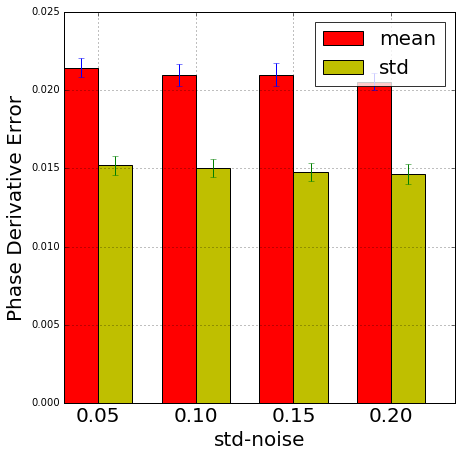

In [173]:
N = len(stdNoiseList)
ind = np.arange(N)  # the x locations for the groups
width = 0.35       # the width of the bars

fig, ax = plt.subplots(figsize=(7, 7))

mean_meanPhaseDiffError = np.mean(simResult['meanPhaseDiffError'], 1)
std_meanPhaseDiffError = np.std(simResult['meanPhaseDiffError'], 1)
rects1 = ax.bar(ind, mean_meanPhaseDiffError, width, color='r', yerr=std_meanPhaseDiffError)

mean_stdPhaseDiffError = np.mean(simResult['stdPhaseDiffError'], 1)
std_stdPhaseDiffError = np.std(simResult['stdPhaseDiffError'], 1)
rects2 = ax.bar(ind + width, mean_stdPhaseDiffError, width, color='y', yerr=std_stdPhaseDiffError)

# add some text for labels, title and axes ticks
ax.set_ylabel('Phase Derivative Error',fontsize=labelsize)
ax.set_xlabel('std-noise', fontsize=labelsize)
ax.set_xticks(ind + width)
ax.set_xticklabels(['%.2f' % n for n in stdNoiseList], fontsize=labelsize, )

ax.legend((rects1[0], rects2[0]), ('mean', 'std'), fontsize=labelsize, framealpha=0.8)
SaveFigToDisk(resultsDir, 'phase_derivative_error')

### Try differen non-rigid registration strategies

In [ ]:
def warp_optical_flow(img, flow):
    
    h, w = flow.shape[:2]
    flow = -flow
    flow[:,:,0] += np.arange(w)
    flow[:,:,1] += np.arange(h)[:,np.newaxis]
    res = cv2.remap(img, flow, None, cv2.INTER_LINEAR)
    return res  

im1 = imInput[:, :, 0].astype('float32')
im2 = imInput[:, :, 3].astype('float32')

tStart = time.time()
flow = cv2.calcOpticalFlowFarneback(im1, im2, 0.5, 4, 15, 3, 7, 1.5, 0)
imWarp = warp_optical_flow(im1, flow)
print 'Registration took %f seconds' % (time.time() - tStart)

plt.figure()
plt.subplot(1, 4, 1)
plt.imshow(im1)

plt.subplot(1, 4, 2)
plt.imshow(im2)

plt.subplot(1, 4, 3)
plt.imshow(imWarp)

plt.subplot(1, 4, 4)
plt.imshow(np.abs(imWarp-im2))


In [ ]:
def warp_elastix(im1, im2, pmap, alpha=1.0):
    
    im1_sitk = sitk.GetImageFromArray(im1)
    im2_sitk = sitk.GetImageFromArray(im2)

    elastix = sitk.SimpleElastix()
    elastix.LogToConsoleOff()
    
    elastix.SetFixedImage(im2_sitk)
    elastix.SetMovingImage(im1_sitk)
    elastix.SetParameterMap(pmap)

    elastix.LogToConsoleOn()
    sitk.PrettyPrint(plist)    
    elastix.LogToConsoleOff()
    
    elastix.Execute()

    imResult = sitk.GetArrayFromImage(elastix.GetResultImage())
    
    transformParams = elastix.GetTransformParameterMap()
    
    return imResult, transformParams

defaultVal = [str(np.median(imInput[:, 0, 0]))]
pmap_affine = sitk.GetDefaultParameterMap("affine", 4)
pmap_affine["DefaultPixelValue"] = defaultVal
pmap_affine["MaximumNumberOfIterations"] = ["256"]
pmap_affine["Metric"] = ["AdvancedMeanSquares"]
pmap_affine["Transform"] = ["SimilarityTransform"]

pmap_nonrigid = sitk.GetDefaultParameterMap("nonrigid", 4)
pmap_nonrigid["DefaultPixelValue"] = defaultVal
pmap_nonrigid["MaximumNumberOfIterations"] = ["256"]
pmap_nonrigid["Metric"] = ["AdvancedMeanSquares"]

plist = sitk.ParameterMapList()
plist.append(pmap_affine)
plist.append(pmap_nonrigid)

sitk.PrettyPrint(plist)

im1 = imInput[:, :, 0].astype('float32')
im2 = imInput[:, :, 3].astype('float32')

tStart = time.time()
imWarp, params = warp_elastix(im1, im2, plist)
print 'Registration took %f seconds' % (time.time() - tStart)

plt.figure()
plt.subplot(1, 4, 1)
plt.imshow(im1)

plt.subplot(1, 4, 2)
plt.imshow(im2)

plt.subplot(1, 4, 3)
plt.imshow(imWarp)

plt.subplot(1, 4, 4)
plt.imshow(np.abs(imWarp-im2))

In [ ]:
import registration_utilities as ru
import registration_callbacks as rc

def warp_simpleitk(im1, im2, alpha=1, 
                   gridSpacingFactor=0.15, gradConvTol=1e-4, 
                   affineIter=50, bsplineIter=50, debug=False):
    
    moving_image = sitk.GetImageFromArray(im1)
    fixed_image = sitk.GetImageFromArray(im2)
    
    #
    # affine registration
    #
    if debug:
        print '>>> Performing affine registration ...'
    
    affineReg = sitk.ImageRegistrationMethod()
    
    # metric
    affineReg.SetMetricAsMeanSquares()
    affineReg.SetMetricSamplingStrategy(affineReg.RANDOM)
    affineReg.SetMetricSamplingPercentage(0.01)
    
    # interpolator
    affineReg.SetInterpolator(sitk.sitkLinear)
    
    # transform
    initial_transform = sitk.CenteredTransformInitializer(fixed_image, moving_image, 
                                                          sitk.Similarity2DTransform(), 
                                                          sitk.CenteredTransformInitializerFilter.GEOMETRY)
    
    affineReg.SetInitialTransform(initial_transform)
    
    # optimizer
    #affineReg.SetOptimizerAsGradientDescent(learningRate=1.0, numberOfIterations=50, estimateLearningRate=affineReg.Once)   
    affineReg.SetOptimizerAsLBFGSB(gradientConvergenceTolerance=gradConvTol, maximumNumberOfIterations=affineIter)
    affineReg.SetOptimizerScalesFromPhysicalShift()
    
    # multi-resolution setup
    affineReg.SetShrinkFactorsPerLevel(shrinkFactors = [4,2,1])
    affineReg.SetSmoothingSigmasPerLevel(smoothingSigmas = [2,1,0])
    affineReg.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()
   
    # connect all of the observers so that we can perform plotting during registration
    if debug:
        affineReg.AddCommand(sitk.sitkStartEvent, rc.metric_start_plot)
        affineReg.AddCommand(sitk.sitkEndEvent, rc.metric_end_plot)
        affineReg.AddCommand(sitk.sitkMultiResolutionIterationEvent, rc.metric_update_multires_iterations) 
        affineReg.AddCommand(sitk.sitkIterationEvent, lambda: rc.metric_plot_values(affineReg))
    
    # Execute
    affine_transform = affineReg.Execute(fixed_image, moving_image)
    
    if debug:
        print('Final metric value for affine registration: {0}'.format(affineReg.GetMetricValue()))
        print('Optimizer\'s stopping condition, {0}'.format(affineReg.GetOptimizerStopConditionDescription()))

    #
    # Bspline registration
    #
    if debug:
        print '>>> Performing bspline registration ...'
    
    bsplineReg = sitk.ImageRegistrationMethod()
    
    # metric
    bsplineReg.SetMetricAsMeanSquares()
    bsplineReg.SetMetricSamplingStrategy(affineReg.RANDOM)
    bsplineReg.SetMetricSamplingPercentage(0.01)
    
    # interpolator
    bsplineReg.SetInterpolator(sitk.sitkLinear)
    
    # initial transform
    bsplineReg.SetMovingInitialTransform(affine_transform)
    mesh_size = [int(gridSpacingFactor * sz) for sz in fixed_image.GetSize()]
    if debug:
        print mesh_size
    initial_transform = sitk.BSplineTransformInitializer(fixed_image, mesh_size, order=3)
      
    bsplineReg.SetInitialTransform(initial_transform)
    
    # optimizer
    #bsplineReg.SetOptimizerAsGradientDescent(learningRate=1.0, numberOfIterations=100, estimateLearningRate=bsplineReg.Once)   
    bsplineReg.SetOptimizerAsLBFGSB(gradientConvergenceTolerance=gradConvTol, maximumNumberOfIterations=bsplineIter)
    bsplineReg.SetOptimizerScalesFromPhysicalShift()
    
    # multi-resolution setup
    bsplineReg.SetShrinkFactorsPerLevel(shrinkFactors = [4,2,1])
    bsplineReg.SetSmoothingSigmasPerLevel(smoothingSigmas = [2,1,0])
    bsplineReg.SmoothingSigmasAreSpecifiedInPhysicalUnitsOn()
   
    # connect all of the observers so that we can perform plotting during registration
    if debug:
        bsplineReg.AddCommand(sitk.sitkStartEvent, rc.metric_start_plot)
        bsplineReg.AddCommand(sitk.sitkEndEvent, rc.metric_end_plot)
        bsplineReg.AddCommand(sitk.sitkMultiResolutionIterationEvent, rc.metric_update_multires_iterations) 
        bsplineReg.AddCommand(sitk.sitkIterationEvent, lambda: rc.metric_plot_values(bsplineReg))
    
    # Execute
    bspline_transform = bsplineReg.Execute(fixed_image, moving_image)
    
    if debug:
        print('Final metric value: {0}'.format(bsplineReg.GetMetricValue()))
        print('Optimizer\'s stopping condition, {0}'.format(bsplineReg.GetOptimizerStopConditionDescription()))
    
    # compose affine and bspline transform
    final_transform = sitk.Transform(bspline_transform)
    final_transform.AddTransform(affine_transform)
    
    # convert to displacement field image
    disp_field_converter = sitk.TransformToDisplacementFieldFilter()
    disp_field_converter.SetReferenceImage(fixed_image)
    
    disp_field_image = disp_field_converter.Execute(final_transform)
    
    # module displacement field image
    disp_field_image_fwd = sitk.GetImageFromArray(alpha * sitk.GetArrayFromImage(disp_field_image), isVector=True)
    disp_field_image_bck = sitk.GetImageFromArray((1 - alpha) * sitk.GetArrayFromImage(disp_field_image), isVector=True)
    
    # transform moving image
    defaultVal = np.double(np.median(im1[:, 0]))
    
    final_transform_fwd = sitk.DisplacementFieldTransform(disp_field_image_fwd)
    moving_resampled = sitk.Resample(moving_image, fixed_image, final_transform_fwd,
                                     sitk.sitkLinear, defaultVal, fixed_image.GetPixelIDValue())    

    # transform fixed image
    defaultVal = np.double(np.median(im2[:, 0]))
    final_transform_bck = sitk.DisplacementFieldTransform(disp_field_image_bck)
    fixed_resampled = sitk.Resample(fixed_image, fixed_image, final_transform_bck,
                                    sitk.sitkLinear, defaultVal, fixed_image.GetPixelIDValue())    
    
    imResult = 0.5 * (sitk.GetArrayFromImage(fixed_resampled) + sitk.GetArrayFromImage(moving_resampled))
    
    return imResult, final_transform    

im1 = imInput[:, :, 0].astype('float32')
im2 = imInput[:, :, 3].astype('float32')

tStart = time.time()
imWarp, final_transform = warp_simpleitk(im1, im2)

print 'Registration took %f seconds' % (time.time() - tStart)

plt.figure()
plt.subplot(1, 4, 1)
plt.imshow(im1)

plt.subplot(1, 4, 2)
plt.imshow(im2)

plt.subplot(1, 4, 3)
plt.imshow(imWarp)

plt.subplot(1, 4, 4)
plt.imshow(np.abs(imWarp-im2))

### Try optical flow

In [27]:
def draw_flow(img, flow, step=16):
    h, w = img.shape[:2]
    y, x = np.mgrid[step/2:h:step, step/2:w:step].reshape(2,-1)
    fx, fy = flow[y,x].T
    lines = np.vstack([x, y, x+fx, y+fy]).T.reshape(-1, 2, 2)
    lines = np.int32(lines + 0.5)
    vis = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    cv2.polylines(vis, lines, 0, (0, 255, 0))
    for (x1, y1), (x2, y2) in lines:
        cv2.circle(vis, (x1, y1), 1, (0, 255, 0), -1)
    return vis

def draw_hsv(flow):
    h, w = flow.shape[:2]
    fx, fy = flow[:,:,0], flow[:,:,1]
    ang = np.arctan2(fy, fx) + np.pi
    v = np.sqrt(fx*fx+fy*fy)
    hsv = np.zeros((h, w, 3), np.uint8)
    hsv[...,0] = ang*(180/np.pi/2)
    hsv[...,1] = 255
    hsv[...,2] = np.minimum(v*4, 255)
    bgr = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return bgr

def warp_flow(img, flow):
    h, w = flow.shape[:2]
    flow = -flow
    flow[:,:,0] += np.arange(w)
    flow[:,:,1] += np.arange(h)[:,np.newaxis]
    res = cv2.remap(img, flow, None, cv2.INTER_LINEAR)
    return res

show_hsv = False
show_glitch = False
blnLoop = True
numFrames = imInput.shape[2]
winsize = np.max(np.ceil(0.05 * np.array(imInput.shape[:2]))).astype('int')

i = 0

while True:

    if i < 1:   
        i = i + 1
        continue

    imPrevFrame = imInput[:, :, i-1]
    imCurFrame = imInput[:, :, i]

    flow = cv2.calcOpticalFlowFarneback(imPrevFrame, imCurFrame, 0.5, 6, winsize, 6, 7, 1.5, 0)

    cvShowColorImage(draw_flow(normalizeArray(imCurFrame), flow), 
                     'flow', '%d/%d' % (i, numFrames), resizeAmount=resizeAmount)

    if show_hsv:
        cvShowColorImage(draw_hsv(flow), 'flow HSV',
                         '%d/%d' % (i, numFrames), resizeAmount=resizeAmount)
    if show_glitch:
        imCurFrameEst = warp_flow(imPrevFrame.copy(), flow)
        
        cvShowImage(normalizeArray(imCurFrameEst), 'warped',
                    '%d/%d' % (i, numFrames), resizeAmount=resizeAmount)
        
        cvShowImage(normalizeArray(np.abs(imCurFrame-imCurFrameEst)), 'diff',
                    '%d/%d' % (i, numFrames), resizeAmount=resizeAmount)

    # look for "esc" key
    k = cv2.waitKey(30) & 0xff

    if k == 27:   # escape
        break
    elif k == ord('1'):
        show_hsv = not show_hsv
        print 'HSV flow visualization is', ['off', 'on'][show_hsv]
    elif k == ord('2'):
        show_glitch = not show_glitch
        print 'glitch is', ['off', 'on'][show_glitch]
        
    if blnLoop:
        
        if k == ord(' '):  # space
            blnLoop = False
        else:
            i = (i + 1) % numFrames
            
    else:
        
        if k == ord(' '): # space                
            blnLoop = True                
        elif k == 81: # left arrow                
            i = (i - 1) % numFrames                
        elif k == 83: # right arrow                
            i = (i + 1) % numFrames              
        
cv2.destroyAllWindows()

glitch is on


### Display results of noise suppression using lowrank + sparse decomposition

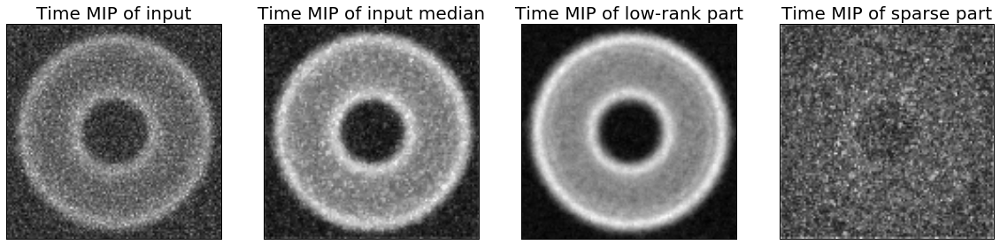

In [20]:
#
# Show MIPs of Input, Lowrank and Sparse parts
#

# Input
plt.figure(figsize=(20,15))

plt.subplot(141)
mplotShowImage(imInput.max(2))
plt.title('Time MIP of input', fontsize=labelsize)
SaveImageToDisk(imInput.max(2), resultsDir, 'imInput_Time_MIP')

# smoothed input
plt.subplot(142)
mplotShowImage(imD.max(2))
plt.title('Time MIP of input median', fontsize=labelsize)
SaveImageToDisk(imD.max(2), resultsDir, 'imD_Time_MIP')

# Low Rank
plt.subplot(143)
mplotShowImage(imLowRank.max(2))
plt.title('Time MIP of low-rank part', fontsize=labelsize)
SaveImageToDisk(imLowRank.max(2), resultsDir, 'imLowRank_Time_MIP')

# Sparse
plt.subplot(144)
mplotShowImage(imSparse.max(2))
plt.title('Time MIP of sparse part', fontsize=labelsize)
SaveImageToDisk(imSparse.max(2), resultsDir, 'imSparse_Time_MIP')

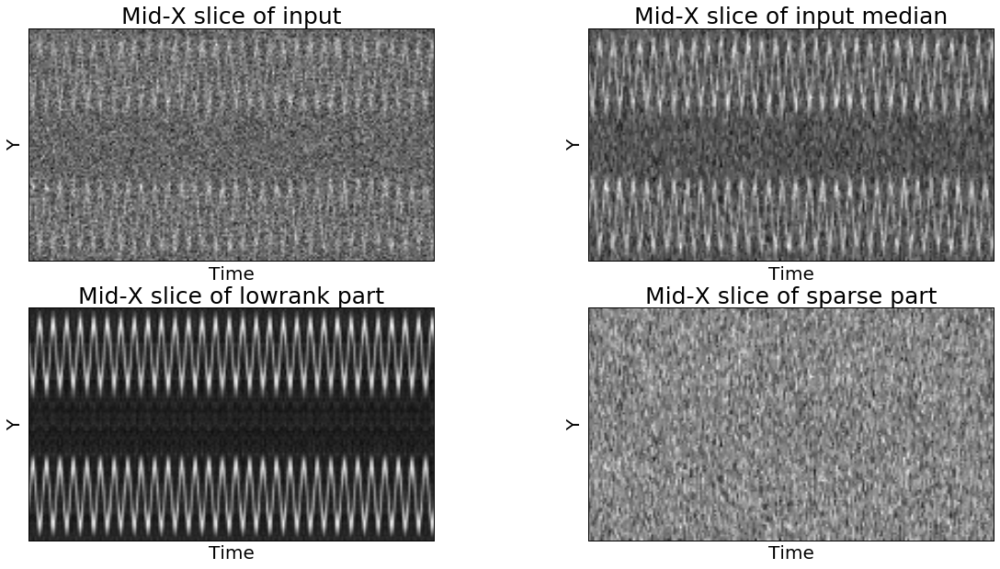

In [21]:
#
# Show Mid XT slices of Input, Lowrank and Sparse parts
#

# Input
plt.figure(figsize=(20, 10))

plt.subplot(221)

mplotShowImage(imInput[:, imInput.shape[1]/2, :])
plt.title('Mid-X slice of input', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('Y', fontsize=labelsize)
SaveImageToDisk(imInput[:, imInput.shape[1]/2, :], resultsDir, 'imInput_MidX')

# Smoothed Input
plt.subplot(222)

mplotShowImage(imD[:, imD.shape[1]/2, :])
plt.title('Mid-X slice of input median', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('Y', fontsize=labelsize)
SaveImageToDisk(imD[:, imD.shape[1]/2, :], resultsDir, 'imD_MidX')

# Low Rank
plt.subplot(223)

mplotShowImage(imLowRank[:, imLowRank.shape[1]/2, :])
plt.title('Mid-X slice of lowrank part', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('Y', fontsize=labelsize)
SaveImageToDisk(imLowRank[:, imLowRank.shape[1]/2, :], resultsDir, 'imLowRank_MidX')

# Sparse
plt.subplot(224)

mplotShowImage(imSparse[:, imSparse.shape[1]/2, :])
plt.title('Mid-X slice of sparse part', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('Y', fontsize=labelsize)
SaveImageToDisk(imSparse[:, imSparse.shape[1]/2, :], resultsDir, 'imSparse_MidX')


In [25]:
# see video
cvShowVideo([normalizeArray(imD), normalizeArray(imLowRank), normalizeArray(imSparse)], 
            ['Input', 'Low-rank', 'Sparse'], 
            resizeAmount=resizeAmount)

In [22]:
# save results to disk
writeVideoToFile(normalizeArray(imD) * 255, 
                 os.path.join(resultsDir, '%s.D.g%.4f.avi' % (resultFilePrefix, gamma)), 
                 codec='DIVX', fps=framesPerSecDownsmp)
writeVideoToFile(normalizeArray(imLowRank) * 255, 
                 os.path.join(resultsDir, '%s.lowrank.g%.4f.avi' % (resultFilePrefix, gamma)), 
                 codec='DIVX', fps=framesPerSecDownsmp)
writeVideoToFile(normalizeArray(imSparse) * 255, 
                 os.path.join(resultsDir, '%s.sparse.g%.4f.avi' % (resultFilePrefix, gamma)), 
                 codec='DIVX', fps=framesPerSecDownsmp)

True
Writing video /home/cdeepakroy/work/gdrive_kitware/LowCostUltrasound/results/videos/VibratingCircle/VibratingCircle.D.g1.0000.avi took 0.0623540878296 seconds
True
Writing video /home/cdeepakroy/work/gdrive_kitware/LowCostUltrasound/results/videos/VibratingCircle/VibratingCircle.lowrank.g1.0000.avi took 0.0598011016846 seconds
True
Writing video /home/cdeepakroy/work/gdrive_kitware/LowCostUltrasound/results/videos/VibratingCircle/VibratingCircle.sparse.g1.0000.avi took 0.0574369430542 seconds


In [ ]:
# save results to disk as tiff stick
writeVideoAsTiffStack(imD, os.path.join(resultsDir, '%s.D' % resultFilePrefix))
writeVideoAsTiffStack(imLowRank, os.path.join(resultsDir, '%s.lowrank' % resultFilePrefix))
writeVideoAsTiffStack(imSparse, os.path.join(resultsDir, '%s.sparse' % resultFilePrefix))

### Display results of phase estimation

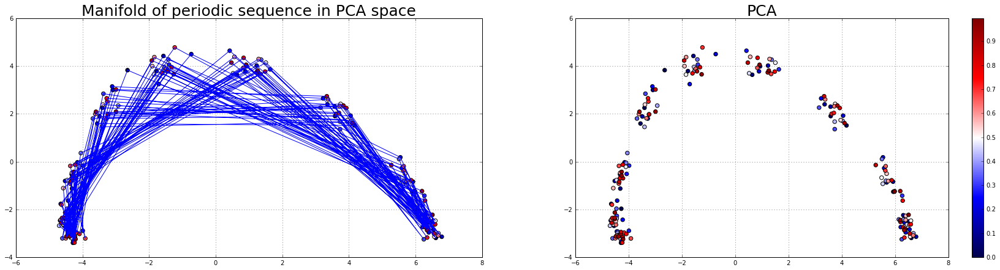

In [38]:
# visualize pca reduced subspace
cmap = plt.cm.seismic
color = np.arange(imInput.shape[2]) / np.float(imInput.shape[2])
#color = ts_instaphase_nmzd_aligned

fig = plt.figure()

plt.subplot(1, 2, 2)
plt.scatter(X_proj[:, 0], X_proj[:, 1], s=40, c=color, cmap=cmap)
plt.title("PCA", fontsize=titlesize)
plt.colorbar()

plt.subplot(1, 2, 1)
plt.scatter(X_proj[:, 0], X_proj[:, 1], s=40, c=color, cmap=cmap)
t = range(X_proj.shape[0])
t.append(0)
plt.plot(X_proj[t, 0], X_proj[t, 1], '-')
plt.title("Manifold of periodic sequence in PCA space", fontsize=titlesize)       

/home/cdeepakroy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:19: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/cdeepakroy/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:20: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


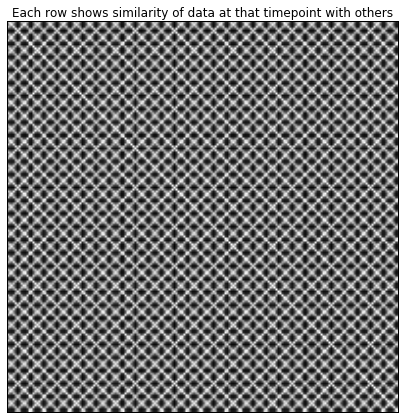

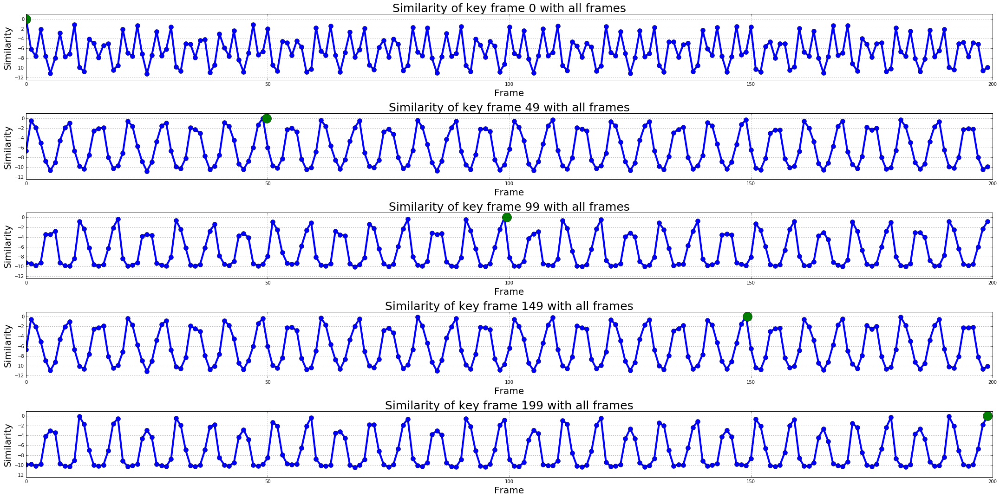

In [27]:
# show the whole similarity landscape       
fig = plt.figure()

mplotShowImage(simMat)
plt.title('Each row shows similarity of data at that timepoint with others')

# show similarity landscape of select frames
plt.figure(figsize=(30,15))

keyFrameList = np.linspace(0, imInput.shape[2]-1, 5, endpoint=True)
#keyFrameList = np.arange(0, 10, 2)

for i in range(len(keyFrameList)):
    
    keyFrameId = keyFrameList[i]
    
    plt.subplot(len(keyFrameList), 1, i+1)
    
    plt.plot(simMat[keyFrameId, :], '-o', markersize=10, linewidth=4)
    plt.plot(keyFrameId, simMat[keyFrameId, keyFrameId], 'o', markersize=20)
    plt.xlabel('Frame', fontsize=labelsize)
    plt.ylabel('Similarity', fontsize=labelsize)
    plt.ylim([simMat.min()-1, simMat.max()+1])     
    plt.xlim([0, simMat.shape[1]])
    plt.title('Similarity of key frame %d with all frames' % keyFrameId, fontsize=titlesize)   
    
plt.tight_layout()    

beats per minute at 6.666667 fps = 60.000000


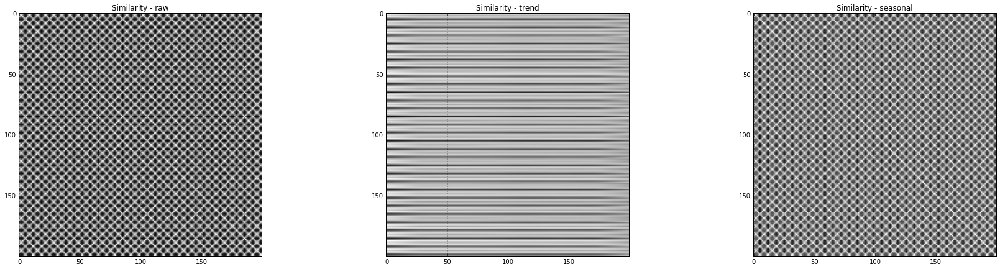

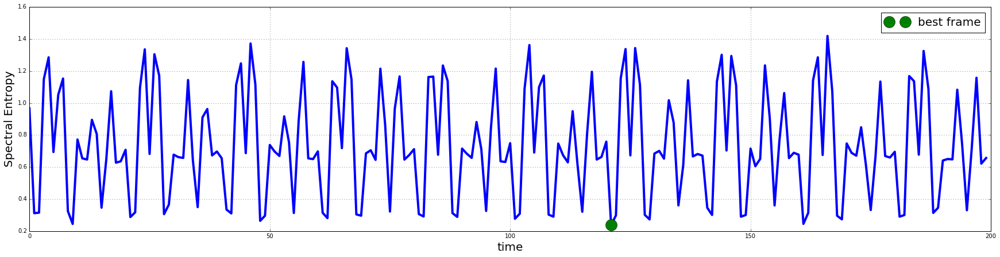

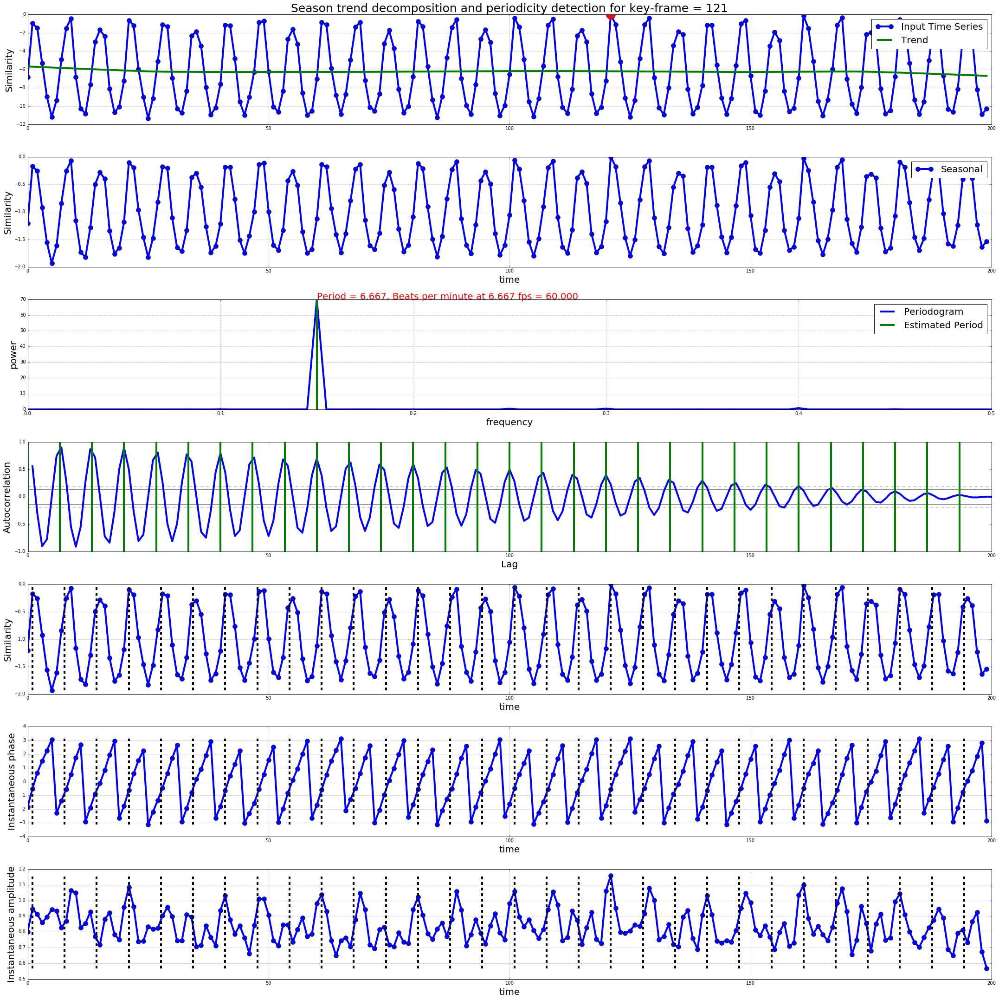

In [24]:
#
# plot the whole similarity landscape along with its trend and seasonal parts
#
fig, ax = plt.subplots(1, 3)

ax[0].imshow(simMat)
ax[0].set_title('Similarity - raw')
SaveImageToDisk(simMat, resultsDir, 'simMat')

ax[1].imshow(simMat_Trend)
ax[1].set_title('Similarity - trend')
SaveImageToDisk(simMat_Trend, resultsDir, 'simMat_Trend')

ax[2].imshow(simMat_Seasonal)
ax[2].set_title('Similarity - seasonal')
SaveImageToDisk(simMat_Seasonal, resultsDir, 'simMat_Seasonal')

#
# Plot frame entropy
#
plt.figure()
plt.plot(spectralEntropy, linewidth=4)
plt.plot(fid_best, spectralEntropy[fid_best], 'o', markersize=20, label='best frame')
plt.xlabel('time', fontsize=labelsize)
plt.ylabel('Spectral Entropy', fontsize=labelsize)
plt.legend(fontsize=labelsize)
SaveFigToDisk(resultsDir, 'spectralEntropy')

#
# Plot time series decomposition
#
fig, ax = plt.subplots(7, 1, figsize=(30, 30))
ax[0].set_title('Season trend decomposition and periodicity detection for key-frame = %d' % fid_best, 
                fontsize=titlesize)

ax[0].plot(ts, '-o', markersize = 10, linewidth=4, label='Input Time Series')
ax[0].plot(ts_trend, linewidth=4, label='Trend')
ax[0].plot(fid_best, ts[fid_best], 'o', markersize=20)
ax[0].legend(fontsize=labelsize)
ax[0].set_ylabel('Similarity', fontsize=labelsize)

ax[1].plot(ts_seasonal, '-o', markersize = 10, linewidth=4, label='Seasonal')
ax[1].set_xlabel('time', fontsize=labelsize)
ax[1].set_ylabel('Similarity', fontsize=labelsize)
ax[1].legend(fontsize=labelsize)

#
# Plot periodogram and estimated period
#
# show period on periodogram
freq, power = scipy.signal.periodogram(ts_seasonal)
beatsPerMinute = algo.period_ * 60.0 / framesPerSecDownsmp
print "beats per minute at %f fps = %f" % (framesPerSecDownsmp, beatsPerMinute)
maxPowerLoc = np.argmax(power)

ax[2].plot(freq, power, linewidth=4, label='Periodogram')
ax[2].plot([freq[maxPowerLoc], freq[maxPowerLoc]], 
           [0, power[maxPowerLoc]], 'g', linewidth=4, label='Estimated Period')
ax[2].text(freq[maxPowerLoc], power[maxPowerLoc], 
           'Period = %.3f, Beats per minute at %.3f fps = %.3f' % (period, framesPerSecDownsmp, beatsPerMinute), 
            fontsize=labelsize, color='r')
ax[2].set_xlabel('frequency', fontsize=labelsize)
ax[2].set_ylabel('power', fontsize=labelsize)
ax[2].legend(fontsize=labelsize)

# show period on the autocorrelation plot
pdplot.autocorrelation_plot(ts_seasonal, ax = ax[3], linewidth=4)
#sm.graphics.tsa.plot_acf(ts_seasonal, ax = ax[1], linewidth=4, fft=True, use_vlines=False, linestyle='-')
xvals = np.arange(0, ts_seasonal.size, period)
for x in xvals:
    ax[3].plot([x, x], [-1, 1], 'g', linewidth=4)
ax[3].yaxis.label.set_size(labelsize)
ax[3].xaxis.label.set_size(labelsize)

# show period on seasonal part and its instaneous phase
ax[4].plot(ts_seasonal, '-o', markersize = 10, linewidth=4)
ax[4].legend(fontsize=labelsize)
ax[4].set_xlabel('time', fontsize=labelsize)
ax[4].set_ylabel('Similarity', fontsize=labelsize)

ax[5].plot(ts_instaphase, '-o', markersize = 10, linewidth=4)
ax[5].set_xlabel('time', fontsize=labelsize)
ax[5].set_ylabel('Instantaneous phase', fontsize=labelsize)

ax[6].plot(ts_instaamp, '-o', markersize = 10, linewidth=4)
ax[6].set_xlabel('time', fontsize=labelsize)
ax[6].set_ylabel('Instantaneous amplitude', fontsize=labelsize)

seaspeakloc = np.argmax(ts_seasonal)
xvals = np.hstack( (np.arange(seaspeakloc, 0, -period), np.arange(seaspeakloc, ts_seasonal.size, period)) )
for x in xvals:    
    ax[4].plot([x, x], [ts_seasonal.min(), ts_seasonal.max()], '--k', linewidth=4)
    ax[5].plot([x, x], [ts_instaphase.min(), ts_instaphase.max()], '--k', linewidth=4)
    ax[6].plot([x, x], [ts_instaamp.min(), ts_instaamp.max()], '--k', linewidth=4)

fig.tight_layout()

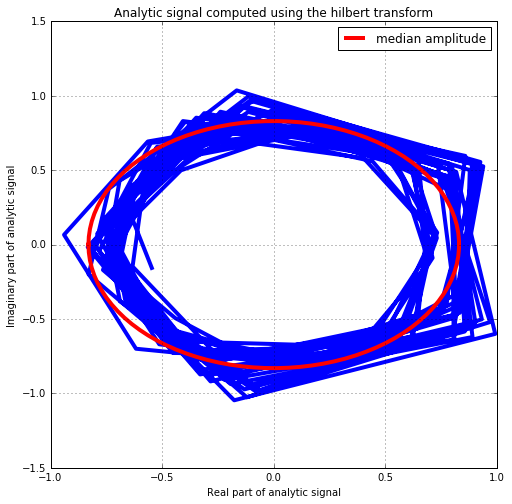

In [26]:
# show analytic signal
plt.figure(figsize=(8,8))
plt.plot(np.real(ts_analytic), np.imag(ts_analytic), linewidth=4)

xvals = np.linspace(-np.pi, np.pi, 100)
medianAmp = np.median(np.abs(ts_analytic))
plt.plot(medianAmp * np.cos(xvals), medianAmp * np.sin(xvals), 'r-', 
         linewidth=4, label='median amplitude')

plt.title('Analytic signal computed using the hilbert transform')
plt.xlabel('Real part of analytic signal')
plt.ylabel('Imaginary part of analytic signal')
plt.legend()

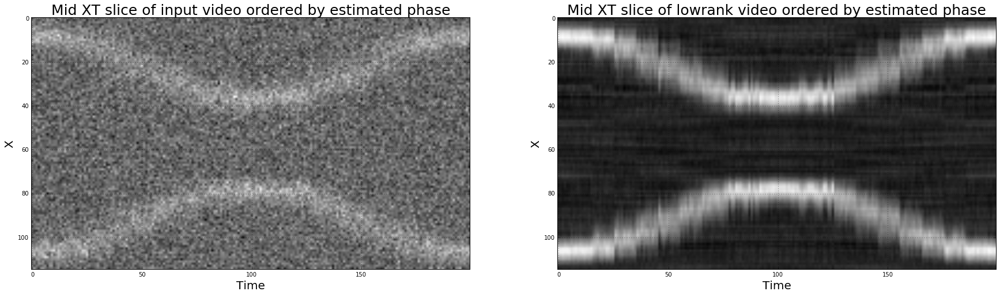

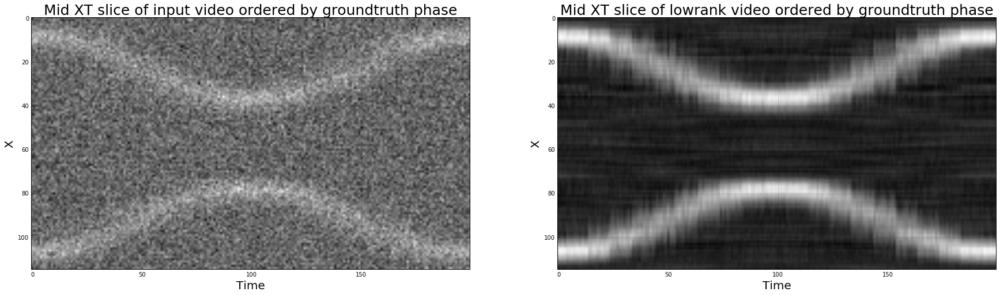

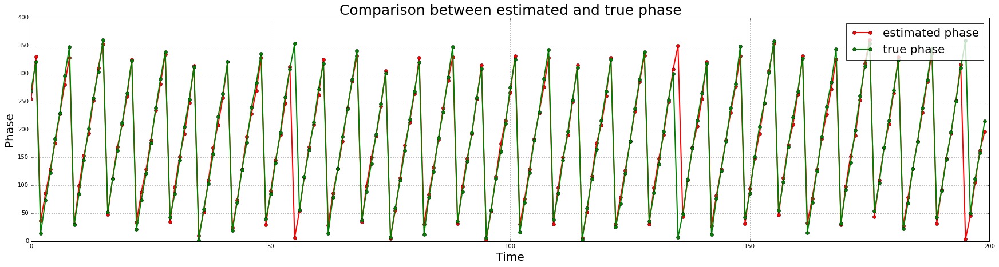

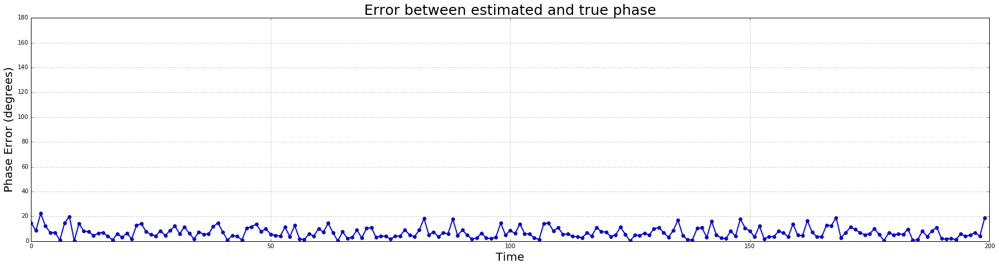

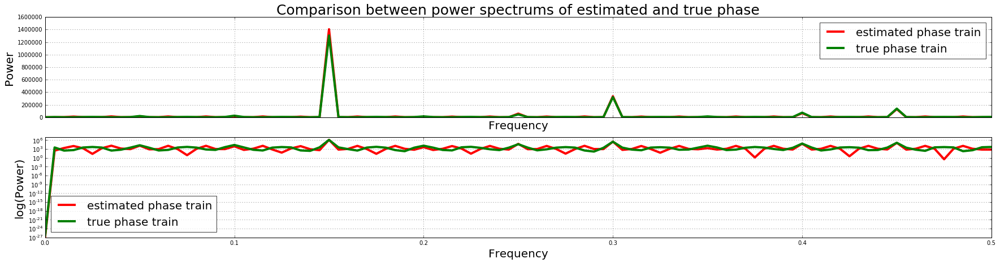

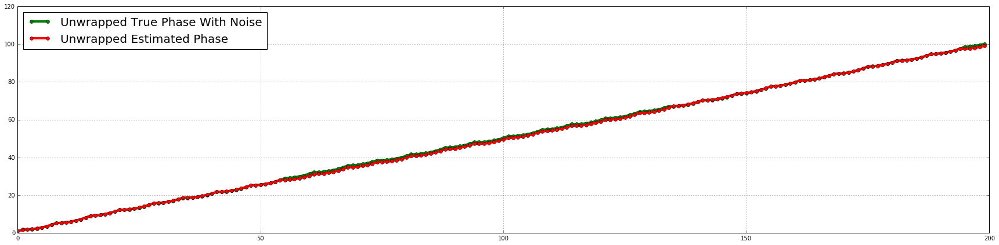

In [27]:
# order frames by phase
phaseord_est = np.argsort( ts_instaphase )
imInput_phaseord_est = imInput[:,:,phaseord_est]
imLowrank_phaseord_est = imLowRank[:,:,phaseord_est]

# show mid xz slice
plt.figure(figsize=(30, 10))

plt.subplot(121)
plt.imshow(imInput_phaseord_est[:, imInput_phaseord_est.shape[1]/2, :])
plt.title('Mid XT slice of input video ordered by estimated phase', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('X', fontsize=labelsize)

plt.subplot(122)
plt.imshow(imLowrank_phaseord_est[:, imLowrank_phaseord_est.shape[1]/2, :])
plt.title('Mid XT slice of lowrank video ordered by estimated phase', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('X', fontsize=labelsize)

# order frames by groundtruth phase
phaseGroundtruthDownsmp = phaseGroundtruth[::timeDownsamplingFrameStep]

phaseError = normalizeAngles(np.rad2deg(ts_instaphase) - phaseGroundtruthDownsmp, [-180, 180])

#phaseError = normalizeAngles(phaseError - phaseError[fid_best], [-180, 180])
phaseError = normalizeAngles(phaseError - np.median(phaseError), [-180, 180])

#phaseOffset = (np.rad2deg(ts_instaphase)[fid_best] - phaseGroundtruthDownsmp[fid_best]) % 360     
phaseOffset = np.median((np.rad2deg(ts_instaphase) - phaseGroundtruthDownsmp) % 360)     

phaseord_gtruth = np.argsort( (phaseGroundtruthDownsmp - phaseOffset) % 360 )
imInput_phaseord_gtruth = imInput[:,:,phaseord_gtruth]
imLowrank_phaseord_gtruth = imLowRank[:,:,phaseord_gtruth]

# show mid xz slice
plt.figure(figsize=(30, 10))

plt.subplot(121)
plt.imshow(imInput_phaseord_gtruth[:, imInput_phaseord_gtruth.shape[1]/2, :])
plt.title('Mid XT slice of input video ordered by groundtruth phase', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('X', fontsize=labelsize)

plt.subplot(122)
plt.imshow(imLowrank_phaseord_gtruth[:, imLowrank_phaseord_gtruth.shape[1]/2, :])
plt.title('Mid XT slice of lowrank video ordered by groundtruth phase', fontsize=titlesize)
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('X', fontsize=labelsize)

# phase train
plt.figure()

plt.plot(((np.rad2deg(ts_instaphase)) % 360), 'ro-', linewidth=2, label='estimated phase')
plt.plot(((phaseGroundtruthDownsmp + phaseOffset) % 360), 'go-', linewidth=2, label='true phase') 

plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('Phase', fontsize=labelsize)
plt.legend(fontsize=labelsize, framealpha=0.8, loc='best')  
plt.title('Comparison between estimated and true phase', fontsize=titlesize)

# phase train error at each time point
plt.figure()

plt.plot(np.abs(phaseError), '-o', linewidth=2)
plt.ylim([0, 180])
plt.xlabel('Time', fontsize=labelsize)
plt.ylabel('Phase Error (degrees)', fontsize=labelsize)
plt.legend(fontsize=labelsize, framealpha=0.8, loc='best')  
plt.title('Error between estimated and true phase', fontsize=titlesize)

# powerspectrun of phase train
fig, ax = plt.subplots(2, 1, sharex=True)

freq_est, power_est = scipy.signal.periodogram(np.rad2deg(ts_instaphase))
freq_true, power_true = scipy.signal.periodogram(phaseGroundtruthDownsmp)

ax[0].plot(freq_est, power_est, 'r-', label = 'estimated phase train', linewidth=linewidth)
ax[0].plot(freq_true, power_true, 'g-', label = 'true phase train', linewidth=linewidth)
ax[0].set_xlabel('Frequency', fontsize=labelsize)
ax[0].set_ylabel('Power', fontsize=labelsize)
ax[0].set_title('Comparison between power spectrums of estimated and true phase', fontsize=titlesize)
ax[0].legend(fontsize=labelsize, framealpha=0.75, loc='best')    

ax[1].semilogy(freq_est, power_est, 'r-', label = 'estimated phase train', linewidth=linewidth)
ax[1].semilogy(freq_true, power_true, 'g-', label = 'true phase train', linewidth=linewidth)
ax[1].set_xlabel('Frequency', fontsize=labelsize)
ax[1].set_ylabel('log(Power)', fontsize=labelsize)
ax[1].legend(fontsize=labelsize, framealpha=0.75, loc='best')    

# compare unwrapped phases
plt.figure()

unwrapped_TruePhase_withnoise = (((phaseGroundtruthDownsmp + phaseOffset) % 360) / 360)
unwrapped_EstimatedPhase = ((np.rad2deg(ts_instaphase) % 360) / 360)

plt.plot( np.cumsum(unwrapped_TruePhase_withnoise), 'g-o', 
         linewidth=linewidth, label='Unwrapped True Phase With Noise')
plt.plot( np.cumsum(unwrapped_EstimatedPhase), 'r-o', 
         linewidth=linewidth, label='Unwrapped Estimated Phase')    
plt.legend(fontsize=labelsize, loc='best')

In [22]:
# show video
cvShowVideo([normalizeArray(imInput_phaseord_est), normalizeArray(imLowrank_phaseord_est), 
             normalizeArray(imInput_phaseord_gtruth), normalizeArray(imLowrank_phaseord_gtruth)],
            ['Input Video ordered by estimated phase', 'Lowrank Video ordered by estimated phase',
             'Input Video ordered by true phase', 'Lowrank Video ordered by true phase',], 
            resizeAmount=resizeAmount)   


In [30]:
writeVideoToFile(normalizeArray(imInput_phaseord_est), 
                 os.path.join(resultsDir, '%s.PhaseOrderedInput.avi' % resultFilePrefix), 
                 codec='DIVX', fps=12)

writeVideoToFile(normalizeArray(imLowrank_phaseord_est), 
                 os.path.join(resultsDir, '%s.PhaseOrderedLowrank.avi' % resultFilePrefix), 
                 codec='DIVX', fps=12)

True
Writing video ./VibratingCircle/VibratingCircle.PhaseOrderedInput.avi took 0.00449514389038 seconds
True
Writing video ./VibratingCircle/VibratingCircle.PhaseOrderedLowrank.avi took 0.00340008735657 seconds


## Step-4: Generate high-resolution video of one period using instantaneous phase of seasonal part 

In [34]:
import USGatingAndSuperResolution as superUS

sigmaGKR =  0.0629985023923
01% 02% 03% 04% 05% 06% 07% 08% 09% 10% 11% 12% 13% 14% 15% 16% 17% 18% 19% 20% 21% 22% 23% 24% 25% 26% 27% 28% 29% 30% 31% 32% 33% 34% 35% 36% 37% 38% 39% 40% 41% 42% 43% 44% 45% 46% 47% 48% 49% 50% 51% 52% 53% 54% 55% 56% 57% 58% 59% 60% 61% 62% 63% 64% 65% 66% 67% 68% 69% 70% 71% 72% 73% 74% 75% 76% 77% 78% 79% 80% 81% 82% 83% 84% 85% 86% 87% 88% 89% 90% 91% 92% 93% 94% 95% 96% 97% 98% 99%

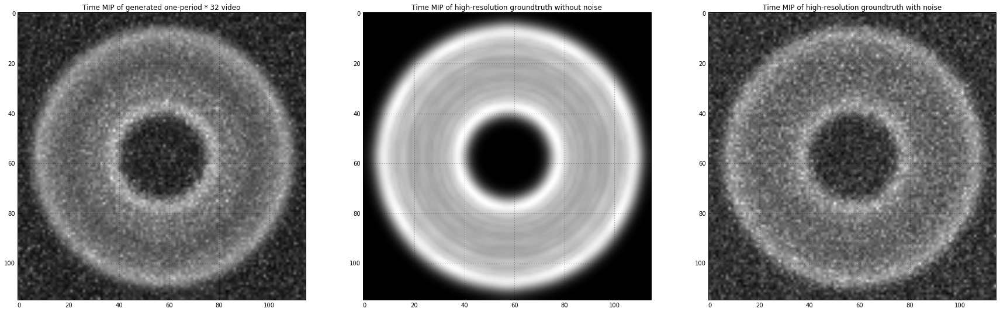

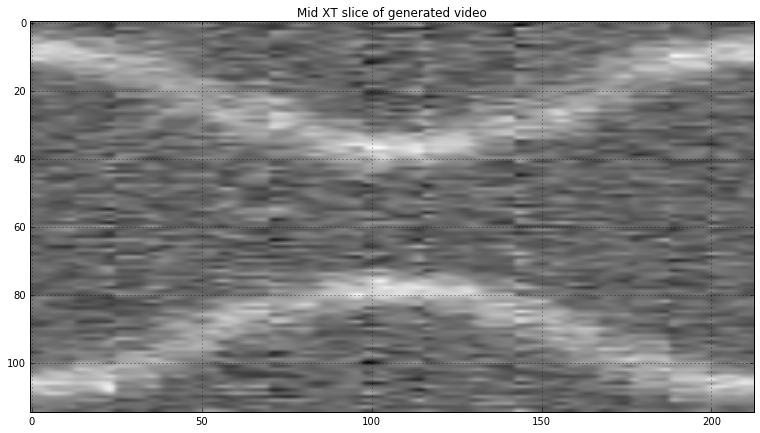

In [35]:
# set upsampling amount
upsamplePerioidFactor = 32

kreg_params = superUS.config_framegen_using_kernel_regression()
optflow_params = superUS.config_framegen_using_optical_flow()
mparams = kreg_params

# generate video of requested resolution using estimated phase
numOutFrames = np.uint( upsamplePerioidFactor * period + 0.5 )        

imOurOnePeriodMagVideo = algo.generateSinglePeriodVideo(numOutFrames, method=mparams)

SaveImageToDisk(imOurOnePeriodMagVideo[:,imOurOnePeriodMagVideo.shape[1]/2,:], 
                resultsDir, 'imCircleSuperRes_%d' % upsamplePerioidFactor)

#
# show mips
#

# display MIP of generated video
plt.figure(figsize=(30,20))

plt.subplot(231)
plt.imshow(imOurOnePeriodMagVideo.max(2))
plt.title('Time MIP of generated one-period * %d video' % upsamplePerioidFactor)   

# display MIP of groundtruth
plt.subplot(232)
plt.imshow(imInput_highres_prenoise.max(2))
plt.title('Time MIP of high-resolution groundtruth without noise')        

plt.subplot(233)
plt.imshow(imInput_highres.max(2))
plt.title('Time MIP of high-resolution groundtruth with noise')

# display mid XT slice of generated video
plt.figure()

plt.imshow(imOurOnePeriodMagVideo[:,imOurOnePeriodMagVideo.shape[1]/2,:])
plt.title('Mid XT slice of generated video')   

In [36]:
cvShowVideo([normalizeArray(imInput), normalizeArray(imOurOnePeriodMagVideo)],
            ['Original Video', 'Synthesized One Period Video'], resizeAmount=resizeAmount)

In [160]:
writeVideoToFile(imOurOnePeriodMagVideo, 
                 os.path.join(resultsDir, '%s.OurOnePeriodx%d.avi' % (resultFilePrefix, upsamplePerioidFactor)), 
                 codec='DIVX', fps=12)

True
Writing video /home/cdeepakroy/work/gdrive_kitware/LowCostUltrasound/results/videos/SHeart2015-02-20-HRes-HFPS/Heart_20150220_151322/Heart_20150220_151146.OurOnePeriodx8.avi took 0.723564147949 seconds


# Validation

In [111]:
def ncorr(imA, imB):
    
    imA = (imA - imA.mean()) / imA.std()
    imB = (imB - imB.mean()) / imB.std()
    
    return np.mean(imA * imB)    

In [22]:
class simClass(object):
    def __init__(self):
        pass

### Test super-resolution of different amounts

In [26]:
simParams = simClass()

simParams.downSampleFactorList = [2, 3, 4]

simParams.minRadius = 20
simParams.maxRadius = 50
simParams.smoothFactor = 0.1

simParams.numPeriods = 30
simParams.numSamplesPerPeriod = 5 * 7
simParams.phaseNoiseLevel = 0.8 # fraction of (sampling-interval / 2)
simParams.stdNoise = 0.1

simParams.splineOrder = 3

simParams.resizeAmount = 4.0

simParams.numTrials = 1

# Run simulation
np.random.seed(1)

prevPercent = 0
numParamValues = len(simParams.downSampleFactorList)
iter = 0

simParams.quality_ncorr = np.zeros( (numParamValues, simParams.numTrials) )
simParams.quality_ncorr_spline = np.zeros( (numParamValues, simParams.numTrials) )

simParams.result = [None]*numParamValues
simParams.gtruth = [None]*numParamValues

tSim = time.time()

for pid in range(numParamValues) :

    simParams.result[pid] = []
    simParams.gtruth[pid] = []
    
    for tid in range(simParams.numTrials):
        
        print '\n\n****************************************************************'
        print 'Running trial %d with downsampling factor %d' % (tid+1, simParams.downSampleFactorList[pid])
        print '****************************************************************'
        
        tTrial = time.time()
        
        # generate video
        print '\n>>> Generating circle video ...\n'
        
        samplingInterval = 360 / simParams.numSamplesPerPeriod # in degrees
        phaseNoiseMax = simParams.phaseNoiseLevel * (samplingInterval / 2.0)

        curPhaseGroundtruth_prenoise = np.linspace(0, 360 * simParams.numPeriods, 
                                                   simParams.numSamplesPerPeriod * simParams.numPeriods, 
                                                   endpoint=False) % 360
        curPhaseGroundtruth = (curPhaseGroundtruth_prenoise + 
                               (2 * np.random.rand(curPhaseGroundtruth_prenoise.size) - 1) * phaseNoiseMax) % 360
        curPhaseGroundtruth_prenoise += -180
        curPhaseGroundtruth += -180

        imCurInput_highres, ts_radius_highres, imCurInput_highres_prenoise = \
            genCircleData(np.deg2rad(curPhaseGroundtruth), 
                          minRadius=simParams.minRadius, 
                          maxRadius=simParams.maxRadius, 
                          smoothFactor=simParams.smoothFactor,
                          stdNoise=simParams.stdNoise)

        curFramesPerSec = simParams.numSamplesPerPeriod
        
        # apply down sampling
        print '\n >>> Applying downsampling ...\n'
        
        timeDownsamplingFrameStep = simParams.downSampleFactorList[pid]

        assert(timeDownsamplingFrameStep >= 1 and 
               (timeDownsamplingFrameStep - np.floor(timeDownsamplingFrameStep) == 0))

        imCurInput = imCurInput_highres[:, :, ::timeDownsamplingFrameStep]

        curFramesPerSecDownsmp = curFramesPerSec * (1.0 / timeDownsamplingFrameStep)

        print '\nImage Size before downsampling in time: ', imCurInput_highres.shape
        print 'Image Size after downsampling in time: ', imInput.shape

        print '\nFrames per sec before downsampling in time: ', curFramesPerSec
        print 'Frames per sec after downsampling in time: ', curFramesPerSecDownsmp        

        # run our phase esimation algorithm
        print '\n>>> Running our phase estimation algorithm ...\n'
        
        import USGatingAndSuperResolution as superUS
        algo = superUS.USGatingAndSuperResolution(xyDownsamplingFactor=0.5)
        algo.setInput(imCurInput)
        algo.process()

        # reconstruct dropped frames
        imDropped = imCurInput_highres
        imDropped[:, :, ::timeDownsamplingFrameStep] = []
        
        curPhaseGroundtruth_nmzd = (180.0 + curPhaseGroundtruth) / 360.0
        phaseOffset = (algo.ts_instaphase_nmzd_[0] - curPhaseGroundtruth_nmzd[0]) % 1
        curPhaseGroundtruth_nmzd_aligned = (curPhaseGroundtruth_nmzd + phaseOffset) % 1
        phaseValsDropped = curPhaseGroundtruth_nmzd_aligned
        phaseValsDropped[::timeDownsamplingFrameStep] = []
        
        imReconDropped = superUS.generateFramesFromPhaseValues(phaseValsDropped)
        
        simParams.quality_ncorr[pid, tid] = ncorr(imDropped, imReconDropped)
        
        print '\nNCORR using our method = %.5f' % simParams.quality_ncorr[pid, tid]
        
        # update progress
        iter += 1
        
        curPercent = np.floor(100.0*iter/(numParamValues * simParams.numTrials) )
        if curPercent > prevPercent:
            prevPercent = curPercent
            print '%.2d%%' % curPercent,         
        
        print 'This trial took a total of %.2f seconds' % (time.time() - tTrial)

print 'The entire simulation tool a total of %.2f seconds' % (time.time() - tSim)

print 'Performance obtained using our method', simParams.quality_ncorr




****************************************************************
Running trial 1 with downsampling factor 2
****************************************************************

>>> Generating circle video ...



/home/cdeepakroy/anaconda/envs/lcus/lib/python2.7/site-packages/ipykernel/__main__.py:12: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future



 >>> Applying downsampling ...


Image Size before downsampling in time:  (115, 115, 1050)
Image Size after downsampling in time:  (115, 115, 525)

Frames per sec before downsampling in time:  35
Frames per sec after downsampling in time:  17.5

>>> Running our phase estimation algorithm ...


>> Step-1: Suppressing noise using low-rank plus sparse decomposition ...



/home/cdeepakroy/anaconda/envs/lcus/lib/python2.7/site-packages/scipy/ndimage/interpolation.py:549: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


[iter: 0000]: rank(P) = 0004, |C|_0 = 0000, crit=0.6320288208, total sparse =0000
[iter: 0010]: rank(P) = 0260, |C|_0 = 1504282, crit=0.0122529464, total sparse =49731
[iter: 0020]: rank(P) = 0319, |C|_0 = 1589362, crit=0.0000438469, total sparse =48943
[iter: 0030]: rank(P) = 0318, |C|_0 = 1587003, crit=0.0000003498, total sparse =48925
Low-rank plus sparse decomposition took 12.616104126 seconds

Noise suppression took a total of 14.22 seconds

>> Step-2: Estimating instantaneous phase ...

Reducing dimensionality using PCA ...  took 0.472557067871 seconds
46 eigen vectors were needed to cover 99.00% of variance

Computing frame similarity matrix as -ve distance in pca-reduced space ... 
000 001 002 003 004 005 006 007 008 009 010 011 012 013 014 015 016 017 018 019 020 021 022 023 024 025 026 027 028 029 030 031 032 033 034 035 036 037 038 039 040 041 042 043 044 045 046 047 048 049 050 051 052 053 054 055 056 057 058 059 060 061 062 063 064 065 066 067 068 069 070 071 072 073 074 0

ValueError: could not broadcast input array from shape (0) into shape (115,115,525)

In [ ]:
#
# show images
#
if simParams.numTrials > 1:
    selTrialInd = np.argmax(simParams.quality_ncorr, 0)
else:
    selTrialInd = np.ones( (1, numParamValues) )

# show groundtruth
plt.figure()
for pid in range(numParamValues):
    
    # our
    imCurOur = simParams.result[pid][selTrialInd[pid]]
    
    plt.subplot(2, numParamValues, pid+1)
    plt.imshow(imCurOur)
    SaveImageToDisk(imCurOur, resultsDir, 'imCircleSuperRes_%d' % simParams.downSampleFactorList[pid])

    # gtruth
    imCurGtruth = simParams.gtruth[pid][selTrialInd[pid]]
    
    plt.subplot(2, numParamValues, numParamValues*pid+1)
    plt.imshow(imCurGtruth)
    SaveImageToDisk(imCurGtruth, resultsDir, 'imCircleGroundtruth_%d' % simParams.downSampleFactorList[pid])    


## Generate groundtruth by manually cropping a sub-video of one-period length

Look at the instantaneous phase and seasonal part of the frame-to-frame similarity time series and adjust the min/max frame sliders which will then be used to crop out the corresponding part of the video from input high-resolution video

In [40]:
# create min-max frame selector widgets
nf = ts_instaphase.size
minFrameWidget = widgets.IntSliderWidget(min = 0, max = nf, step = 1)
maxFrameWidget = widgets.IntSliderWidget(min = 0, max = nf, step = 1)

# find good initial values for min-max frame
vloc = detect_peaks(ts_instaphase, mph = -np.pi/4, mpd=period * 0.75, valley=True, show=False)
ploc = detect_peaks(ts_instaphase, mph =  np.pi/4, mpd=period * 0.75, valley=False, show=False)

vloc_central = vloc[( (vloc > 0.25 * nf) & (vloc < 0.75 * nf) )]

#vloc_best_ind = np.argmin( np.abs( np.diff( ts_seasonal[vloc_central] ) ) )
vloc_best_ind = np.argmin(ts_instaphase[vloc_central])

minFrameWidget.value = vloc_central[vloc_best_ind]
maxFrameWidget.value = ploc[ploc > minFrameWidget.value + 0.8 * period][0]

# display seasonal part of similarity time series and its instantaneous phase
fig, ax = plt.subplots(2, 1, sharex=True)
plt.close(fig)

ax[0].plot(ts_seasonal, '-o', markersize = 10, linewidth=4)
ax[0].set_xlabel('time', fontsize=labelsize)
ax[0].set_ylabel('Similarity', fontsize=labelsize)
ax[0].legend(fontsize=labelsize, framealpha=0.5)

ax[1].plot(ts_instaphase, '-o', markersize = 10, linewidth=4)
ax[1].set_xlabel('time', fontsize=labelsize)
ax[1].set_ylabel('Instantaneous phase', fontsize=labelsize)
ax[1].plot(ploc, ts_instaphase[ploc], 'ro', markersize = 20, label='peaks')
ax[1].plot(vloc, ts_instaphase[vloc], 'go', markersize = 20, label='valleys')
ax[1].legend(fontsize=labelsize, framealpha=0.5)

# display initial min-max frames
minLine = []
maxLine = []

for aid in range(ax.size):

    minLine.append( ax[aid].plot([minFrameWidget.value, minFrameWidget.value],
                                 ax[aid].get_ylim(), 'g--', linewidth=4)[0] )
    maxLine.append( ax[aid].plot([maxFrameWidget.value, maxFrameWidget.value],
                                 ax[aid].get_ylim(), 'r--', linewidth=4)[0] )

# define and set event handler to show current min-max frames
def show_selected_min_max_frames(minFrame, maxFrame):
    
    # show min-max frames
    for aid in range(ax.size):

        minLine[aid].set_xdata([minFrame, minFrame])
        maxLine[aid].set_xdata([maxFrame, maxFrame])
        
    display(fig)
    
interactive(show_selected_min_max_frames, minFrame = minFrameWidget, maxFrame = maxFrameWidget)

AttributeError: 'module' object has no attribute 'IntSliderWidget'

In [41]:
minFrameHighRes = minFrameWidget.value * timeDownsamplingFrameStep
maxFrameHighRes = maxFrameWidget.value * timeDownsamplingFrameStep
print 'Selected frame range of high-res video: [%d, %d]' % (minFrameHighRes, maxFrameHighRes)

imOnePeriod_Groundtruth = imInput_highres_prenoise[:, :, minFrameHighRes:maxFrameHighRes+1]
print 'Image size of single period groundtruth', imOnePeriod_Groundtruth.shape

# display cropped ground truth
fig, ax = plt.subplots(1, 2)

ax[0].imshow(imOnePeriod_Groundtruth.max(2))
ax[0].set_title('Time MIP of one-period groundtruth')    

ax[1].imshow(imOnePeriod_Groundtruth[:, imOnePeriod_Groundtruth.shape[1]/2, :].T)
ax[1].set_title('Mid-X slice of one-period groundtruth')    

NameError: name 'minFrameWidget' is not defined

In [136]:
cvShowVideo(normalizeArray(imOnePeriod_Groundtruth), 'One-Period Groundtruth', resizeAmount=resizeAmount)

In [227]:
writeVideoToFile(normalizeArray(imOnePeriod_Groundtruth), 
                 os.path.join(resultsDir, '%s.OnePeriod_Groundtruth.avi' % resultFilePrefix), 
                 codec='DIVX', fps=framesPerSec)

True
Writing video /home/cdeepakroy/work/gdrive_kitware/LowCostUltrasound/results/videos/SHeart2015-02-20-HRes-HFPS/Heart_20150220_151146/Heart_20150220_151146.OnePeriod_Groundtruth.avi took 0.192201852798 seconds


## Compare the results of our method with spline interpolation

In [124]:
def generateGatedVideoUsingSplineInterp(imInput, numOutFrames, minFrame, maxFrame, splineOrder=3):
    
    tZoom = np.float(numOutFrames) / (maxFrame - minFrame + 1)

    return scipy.ndimage.interpolation.zoom(imInput[:,:,minFrame:maxFrame+1], (1, 1, tZoom), order=splineOrder)  

In [115]:
numOutFrames = imOnePeriod_Groundtruth.shape[2]

# compute the result using spline interpolation
print '\nValidating the gated video generated using spline interpolation ... ', 

maxSplineOrder = 6

imOnePeriodVal_Spline = [None]*maxSplineOrder
sim_Spline = np.zeros((maxSplineOrder, 1))

for splineOrder in range(maxSplineOrder):
    
    imOnePeriodVal_Spline[splineOrder] = generateGatedVideoUsingSplineInterp(imInput, numOutFrames,
                                                                             minFrameWidget.value, 
                                                                             maxFrameWidget.value,
                                                                             splineOrder)
    
    sim_Spline[splineOrder] = ncorr(imOnePeriod_Groundtruth, imOnePeriodVal_Spline[splineOrder])
    
    # update progress
    print splineOrder,    

# compute result using our method
print '\nValidating the gated video generated using our method ... '

phaseRange = [(i + np.pi) / (2.0 * np.pi) 
              for i in ts_instaphase[ [minFrameWidget.value, maxFrameWidget.value] ] ]

imOnePeriodVal_Our = algo.generateSinglePeriodVideo(imOnePeriod_Groundtruth.shape[2], 
                                                    sigmaGKRFactor=2, phaseRange=phaseRange)  

sim_Our = ncorr(imOnePeriod_Groundtruth, imOnePeriodVal_Our)


Validating the gated video generated using spline interpolation ...  0 1 2 3 4 5 
Validating the gated video generated using our method ... 
sigmaGKR =  0.062812568845
05% 10% 15% 21% 26% 31% 36% 42% 47% 52% 57% 63% 68% 73% 78% 84% 89% 94%


0 1 2 3 4 5

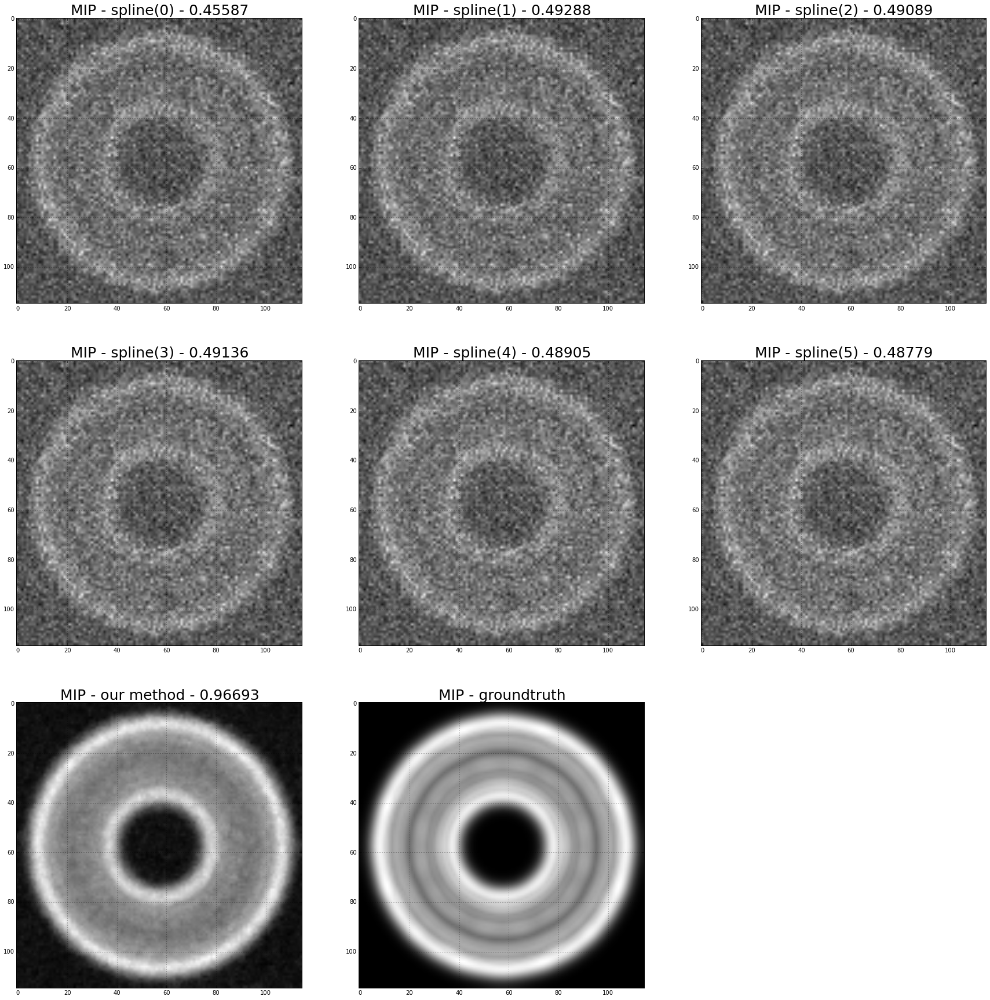

In [116]:
#
# show Time MIPs to check denoising 
#

# show result using spline interpolation
plt.figure(figsize=(30, 30))

for splineOrder in range(maxSplineOrder):
    
    # show MIP
    plt.subplot2grid((3, 3), (splineOrder/3, splineOrder%3))
    imshow(imOnePeriodVal_Spline[splineOrder].max(2))
    plt.title('MIP - spline(%d) - %.5f' % (splineOrder, sim_Spline[splineOrder]), 
              fontsize=titlesize)   

    # update progress
    print splineOrder,    

# show result using our method with RBF
plt.subplot2grid((3, 3), (2, 0))
plt.imshow(imOnePeriodVal_Our.max(2))
plt.title('MIP - our method - %.5f' % sim_Our, fontsize=titlesize)

# show groundtruth
plt.subplot2grid((3, 3), (2, 1))
plt.imshow(imOnePeriod_Groundtruth.max(2))
plt.title('MIP - groundtruth', fontsize=titlesize)

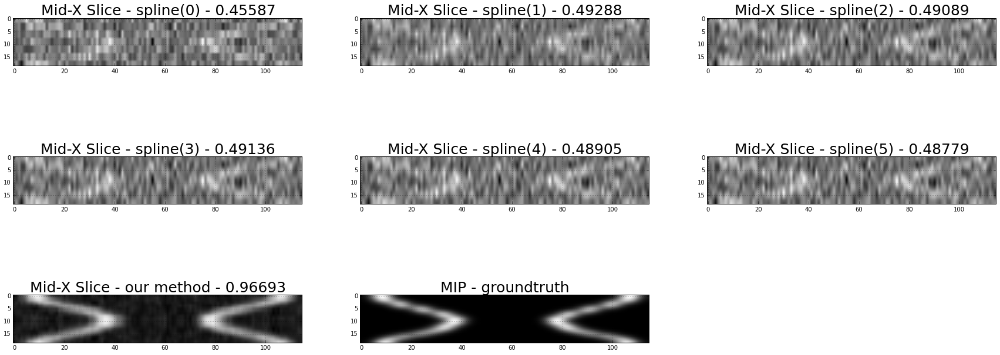

In [117]:
#
# show Mid XT slices 
#

# show result using spline interpolation
plt.figure(figsize=(30, 12))

for splineOrder in range(maxSplineOrder):
    
    # show MIP
    plt.subplot2grid((3, 3), (splineOrder/3, splineOrder%3))
    imshow(imOnePeriodVal_Spline[splineOrder][:, imOnePeriodVal_Spline[splineOrder].shape[1]/2, :].T)
    plt.title('Mid-X Slice - spline(%d) - %.5f' % (splineOrder, sim_Spline[splineOrder]), 
              fontsize=titlesize)   

# compute result using our method with RBF
sim_Our = ncorr(imOnePeriod_Groundtruth, imOnePeriodVal_Our)

plt.subplot2grid((3, 3), (2, 0))
plt.imshow(imOnePeriodVal_Our[:, imOnePeriodVal_Our.shape[1]/2, :].T)
plt.title('Mid-X Slice - our method - %.5f' % sim_Our, fontsize=titlesize)

# show groundtruth
plt.subplot2grid((3, 3), (2, 1))
plt.imshow(imOnePeriod_Groundtruth[:, imOnePeriod_Groundtruth.shape[1]/2, :].T)
plt.title('MIP - groundtruth', fontsize=titlesize)

In [118]:
# show all results together
vids = [normalizeArray(imOnePeriod_Groundtruth)]
vidlabels = ['Groundtruth']

vids.append(normalizeArray(imOnePeriodVal_Our))
vidlabels.append('Our Method') 

for splineOrder in range(maxSplineOrder):
    
    vids.append(normalizeArray(imOnePeriodVal_Spline[splineOrder]))
    vidlabels.append('Spline of order %d' % splineOrder) 

cvShowVideo(vids, vidlabels, resizeAmount=resizeAmount)

In [ ]:
# write our result
writeVideoToFile(normalizeArray(imOnePeriodVal_Our), 
                 os.path.join(resultsDir, '%s.OnePeriod_Our.avi' % resultFilePrefix), 
                 codec='DIVX', fps=12)

In [ ]:
# write spline result
for splineOrder in range(maxSplineOrder):
    
    writeVideoToFile(normalizeArray(imOnePeriodVal_Spline[splineOrder]), 
                     os.path.join(resultsDir, 
                                  '%s.OnePeriod_Spline-ord-%d.avi' % (resultFilePrefix, splineOrder)), 
                     codec='DIVX', fps=12)


## Test the amount of super-resolution possible

In [119]:
def ncorr(imA, imB):
    
    imA = (imA - imA.mean()) / imA.std()
    imB = (imB - imB.mean()) / imB.std()
    
    return np.mean(imA * imB)



****************************************************************
Running trial 1 with downsampling factor 2
****************************************************************

>>> Generating circle video ...



/home/cdeepakroy/anaconda/envs/lcus/lib/python2.7/site-packages/ipykernel/__main__.py:12: DeprecationWarning: using a non-integer number instead of an integer will result in an error in the future



 >>> Applying downsampling ...


Image Size before downsampling in time:  (115, 115, 1050)
Image Size after downsampling in time:  (115, 115, 525)

Frames per sec before downsampling in time:  35
Frames per sec after downsampling in time:  17.5

>>> Running super-resolution algorithm ...


>> Step-1: Suppressing noise using low-rank plus sparse decomposition ...



/home/cdeepakroy/anaconda/envs/lcus/lib/python2.7/site-packages/scipy/ndimage/interpolation.py:549: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


[iter: 0000]: rank(P) = 0004, |C|_0 = 0000, crit=0.6320288208, total sparse =0000
[iter: 0010]: rank(P) = 0260, |C|_0 = 1504282, crit=0.0122529464, total sparse =49731
[iter: 0020]: rank(P) = 0319, |C|_0 = 1589362, crit=0.0000438469, total sparse =48943
[iter: 0030]: rank(P) = 0318, |C|_0 = 1587003, crit=0.0000003498, total sparse =48925
Low-rank plus sparse decomposition took 14.8000848293 seconds

Noise suppression took a total of 16.47 seconds

>> Step-2: Estimating instantaneous phase ...

Reducing dimensionality using PCA ...  took 0.680103063583 seconds
46 eigen vectors were needed to cover 99.00% of variance

Computing frame similarity matrix as -ve distance in pca-reduced space ... 
000 001 002 003 004 005 006 007 008 009 010 011 012 013 014 015 016 017 018 019 020 021 022 023 024 025 026 027 028 029 030 031 032 033 034 035 036 037 038 039 040 041 042 043 044 045 046 047 048 049 050 051 052 053 054 055 056 057 058 059 060 061 062 063 064 065 066 067 068 069 070 071 072 073 074 

TypeError: 'NoneType' object has no attribute '__getitem__'